# mtDSB x Age DE analysis (pydeseq2, LRT-free)

In [1]:
import scanpy as sc
import decoupler as dc
import pertpy as pt
sc.set_figure_params(figsize=(3, 3), frameon=False)
import numpy as np
import pandas as pd
import scanpy as sc
from scipy import sparse
import warnings
warnings.filterwarnings("ignore")

def make_pseudobulk(adata, celltype, ct_col="celltype_merged",
                    sample_cols=("mouse_id","genotype","age"),
                    layer="counts"):
    ad = adata[adata.obs[ct_col] == celltype].copy()
    if layer in ad.layers:
        X = ad.layers[layer]
    else:
        X = ad.X
    if sparse.issparse(X):
        X = X.tocsr()

    # define samples as unique combinations of sample_cols
    meta = ad.obs.loc[:, sample_cols].astype(str)
    meta["sample_id"] = meta.apply(lambda r: "_".join(r.values), axis=1)

    # aggregate counts by sample_id
    sample_ids = meta["sample_id"].values
    uniq = pd.Index(np.unique(sample_ids), name="sample_id")
    # map each cell to column index
    col_index = pd.Series(pd.Categorical(sample_ids, categories=uniq)).cat.codes.values

    # build counts: genes x samples
    n_genes = ad.n_vars
    n_samp  = len(uniq)
    M = np.zeros((n_genes, n_samp), dtype=np.int64)
    # fast aggregate with group-by via numpy
    for s in range(n_samp):
        idx = np.where(col_index == s)[0]
        if len(idx)==0: 
            continue
        Xi = X[idx]
        M[:, s] = Xi.sum(axis=0).A.ravel() if sparse.issparse(Xi) else Xi.sum(axis=0)

    # sample metadata frame
    smd = uniq.to_frame(index=False)
    # split back columns
    parts = smd["sample_id"].str.split("_", expand=True)
    for i, c in enumerate(sample_cols):
        smd[c] = parts[i].values
    smd["condition"] = smd["condition"].astype("category")
    # age: keep both categorical and numeric versions handy
    smd["age"] = smd["age"].astype(str)
    smd["age_num"] = pd.to_numeric(smd["age"], errors="coerce")

    # gene names
    genes = ad.var_names.to_list()

    return pd.DataFrame(M, index=genes, columns=smd["sample_id"]), smd.set_index("sample_id")

# =======================
# mtDSB x Age DE analysis (pydeseq2, LRT-free)
# - Per-age simple effects: model vs control
# - Interaction proxy: delta-LFC between ages with z-test
# Requirements: pydeseq2, anndata, numpy, pandas
# Assumes: pb[ct] = (counts_df [genes x samples], meta_df indexed by sample_id with columns "condition","age")
# =======================

import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests
from anndata import AnnData
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# ---------- helpers ----------
def _align(counts_df, meta_df):
    if not counts_df.columns.equals(meta_df.index):
        common = counts_df.columns.intersection(meta_df.index)
        if len(common) == 0:
            raise ValueError("No overlapping sample IDs between counts_df.columns and meta_df.index")
        counts_df = counts_df.loc[:, common]
        meta_df   = meta_df.loc[common]
    return counts_df, meta_df

def _to_anndata(counts_df, meta_df):
    X = counts_df.T.astype(np.int64)  # samples x genes
    ad = AnnData(X=X.values)
    ad.obs_names = X.index.astype(str)
    ad.var_names = counts_df.index.astype(str)
    ad.obs = meta_df.copy()
    return ad

def _prep_condition(mdf, condition_col="condition", ref_condition="control"):
    mdf = mdf.copy()
    mdf[condition_col] = mdf[condition_col].astype(str).str.strip()
    uniq = list(pd.unique(mdf[condition_col]))
    if ref_condition not in uniq:
        m = [u for u in uniq if u.lower() == ref_condition.lower()]
        if not m:
            raise ValueError(f"Reference '{ref_condition}' not present. Found: {uniq}")
        ref_condition = m[0]
    mdf[condition_col] = pd.Categorical(
        mdf[condition_col],
        categories=[ref_condition] + [u for u in uniq if u != ref_condition],
        ordered=True
    )
    return mdf, ref_condition

def _detect_case(mdf, condition_col="condition", ref_condition="control"):
    cats = list(mdf[condition_col].cat.categories)
    case_levels = [c for c in cats if c != ref_condition]
    if len(case_levels) == 0:
        raise ValueError("No case level found (only control present).")
    return case_levels[0]

def _compute_gene_stats(counts_df, meta_df):
    """
    Compute gene-level stats to judge expression 'meaningfulness'.
    Returns DataFrame indexed by gene with:
      - mean_cpm_all, detect_rate_all
      - mean_cpm_cond_<cond> (per-condition)
      - mean_cpm_age_<age>   (per-age)
    """
    # CPM
    lib = counts_df.sum(axis=0).replace(0, np.nan)
    cpm = counts_df.divide(lib, axis=1) * 1e6

    gs = pd.DataFrame(index=counts_df.index)
    gs["mean_cpm_all"] = cpm.mean(axis=1)
    gs["detect_rate_all"] = (cpm > 0).mean(axis=1)

    if "condition" in meta_df.columns:
        for cond, cols in meta_df.groupby("condition").groups.items():
            cols = list(cols)
            if cols:
                gs[f"mean_cpm_cond_{cond}"] = cpm[cols].mean(axis=1)

    if "age" in meta_df.columns:
        for age, cols in meta_df.groupby("age").groups.items():
            cols = list(cols)
            if cols:
                gs[f"mean_cpm_age_{age}"] = cpm[cols].mean(axis=1)

    return gs

# ---------- DE pieces ----------
def simple_effect_at_age(counts_df, meta_df, age_value,
                         condition_col="condition", ref_condition="control",
                         n_cpus=8):
    counts_df, meta_df = _align(counts_df, meta_df)
    mask = meta_df["age"].astype(str).str.strip() == str(age_value)
    if mask.sum() < 2:
        raise ValueError(f"Not enough samples at age={age_value}")
    cdf = counts_df.loc[:, mask]
    mdf = meta_df.loc[mask].copy()

    mdf, ref_condition = _prep_condition(mdf, condition_col=condition_col, ref_condition=ref_condition)
    case_label = _detect_case(mdf, condition_col=condition_col, ref_condition=ref_condition)

    ad = _to_anndata(cdf, mdf)
    dds = DeseqDataSet(
        adata=ad,
        design_factors=[condition_col],
        refit_cooks=True,
        inference=DefaultInference(n_cpus=n_cpus),
    )
    dds.deseq2()

    st = DeseqStats(dds, contrast=[condition_col, case_label, ref_condition], inference=DefaultInference(n_cpus=n_cpus))
    st.summary()
    res = st.results_df.copy()
    res = res.rename(columns={
        "log2FoldChange": f"log2FC_{case_label}_vs_{ref_condition}",
        "lfcSE":          f"lfcSE_{case_label}_vs_{ref_condition}",
        "pvalue":         f"pvalue_{case_label}_vs_{ref_condition}",
        "padj":           f"padj_{case_label}_vs_{ref_condition}",
    })
    res.attrs = {"contrast": f"{case_label} vs {ref_condition} @ age {age_value}",
                 "age": str(age_value),
                 "case": case_label,
                 "ref": ref_condition}
    return res

def combine_delta_lfc(res_a, res_b):
    lfc_col_a = [c for c in res_a.columns if c.startswith("log2FC_")][0]
    se_col_a  = [c for c in res_a.columns if c.startswith("lfcSE_")][0]
    lfc_col_b = [c for c in res_b.columns if c.startswith("log2FC_")][0]
    se_col_b  = [c for c in res_b.columns if c.startswith("lfcSE_")][0]

    df = pd.DataFrame(index=res_a.index.union(res_b.index))
    df[lfc_col_a] = res_a[lfc_col_a]
    df[se_col_a]  = res_a[se_col_a]
    df[lfc_col_b] = res_b[lfc_col_b]
    df[se_col_b]  = res_b[se_col_b]

    df = df.dropna(subset=[lfc_col_a, se_col_a, lfc_col_b, se_col_b]).copy()

    df["delta_log2FC"] = df[lfc_col_b] - df[lfc_col_a]
    df["se_delta"] = np.sqrt(np.square(df[se_col_a]) + np.square(df[se_col_b]))
    df["se_delta"] = df["se_delta"].replace(0, np.nan)
    df = df.dropna(subset=["se_delta"])
    from scipy.stats import norm
    df["z"] = df["delta_log2FC"] / df["se_delta"]
    df["p_delta"] = 2 * (1 - norm.cdf(np.abs(df["z"])))
    df["q_delta"] = multipletests(df["p_delta"], method="fdr_bh")[1]
    return df

# ---------- main runner with gene stats joined ----------
def run_all(pb, condition_col="condition", outdir=None, n_cpus=8, save_csv=False):
    """
    For each cell type:
      - per-age simple effects (model vs control)
      - pairwise delta-LFC interaction proxy
      - gene_stats computed once and JOINED onto every table
    """
    if save_csv and outdir:
        os.makedirs(outdir, exist_ok=True)

    results = {}
    for ct, (counts_df, meta_df) in pb.items():
        # ensure alignment & compute gene stats once
        counts_df, meta_df = _align(counts_df, meta_df)
        gene_stats = _compute_gene_stats(counts_df, meta_df)

        ages = list(pd.unique(meta_df["age"].astype(str).str.strip()))
        per_age = {}

        # simple effects (join stats)
        for a in ages:
            try:
                res = simple_effect_at_age(counts_df, meta_df, a,
                                           condition_col=condition_col,
                                           ref_condition="control",
                                           n_cpus=n_cpus)
                res = res.join(gene_stats, how="left")
                per_age[a] = res
                if save_csv and outdir:
                    res.to_csv(os.path.join(outdir, f"{ct.replace(' ','_')}_simple_effect_age_{a}.csv"))
            except Exception as e:
                per_age[a] = None
                print(f"[{ct}] simple-effect failed at age={a}: {e}")

        # deltas (join stats)
        deltas = {}
        age_pairs = []
        for i in range(len(ages)):
            for j in range(i+1, len(ages)):
                a, b = ages[i], ages[j]
                if per_age.get(a) is None or per_age.get(b) is None:
                    continue
                dtab = combine_delta_lfc(per_age[a], per_age[b])
                dtab = dtab.join(gene_stats, how="left")
                dtab.attrs = {"age_A": a, "age_B": b,
                              "note": "delta_log2FC = LFC(age_B) - LFC(age_A)"}
                deltas[(a,b)] = dtab
                age_pairs.append((a,b))
                if save_csv and outdir:
                    dtab.to_csv(os.path.join(outdir, f"{ct.replace(' ','_')}_deltaLFC_{a}_vs_{b}.csv"))

        results[ct] = {
            "simple_effects": per_age,
            "deltas": deltas,
            "ages": ages,
            "age_pairs": age_pairs,
            "gene_stats": gene_stats,     # <--- stored for convenience
        }

    return results



## Read data

In [20]:
adata = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered_manual_annotation_with_raw.h5ad')

In [21]:
pd.DataFrame(adata.var.index).to_csv('markers_mouse_xenium.csv')

In [22]:
adata.X = adata.layers['counts']
adata.X = adata.X.astype(int)

In [5]:
glia_classes = [
    # --- Astrocytes ---
    "Telencephalon astrocytes",
    "Olfactory astrocytes",

    # --- Oligodendrocyte lineage ---
    "Mature oligodendrocytes",
    "Oligodendrocytes precursor cells",

    # --- Microglia ---
    "Microglia",
]

In [6]:
adata = adata[adata.obs.cell_class.isin(glia_classes)]

In [23]:
adata

AnnData object with n_obs × n_vars = 980474 × 5101
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'run', 'n_genes_by_counts', 'n_counts', 'n_genes', 'leiden_0.5', 'leiden_1', 'leiden_2', 'cell_class', 'sample_id', 'age', 'sex', 'genotype', 'condition', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cell_class_colors', 'cell_type_colors', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

## Perform pseudobulk

In [24]:
celltypes = adata.obs.cell_class.unique()
pb = {}   # dict: celltype -> (count_df, sample_metadata)
for ct in celltypes:
    pb[ct] = make_pseudobulk(adata, celltype=ct, ct_col = 'cell_class', sample_cols = ('sample_id', 'condition', 'age'))

## Perform DGE

In [ ]:
results = run_all(pb, condition_col="condition", outdir=None, n_cpus=8, save_csv=False)

In [26]:
import numpy as np
import matplotlib.pyplot as plt

def plot_lfc_across_ages_grid(
    results,
    ct,
    genes,
    q=0.05,
    ncols=4,
    figsize=(16, 9),
    sharey=True,
    fontsize_base=13
):
    """
    Plot log2FC across ages for multiple genes in subplots for a given cell type.
    Red dots = padj < q, grey = non-significant.
    Shared y-axis and increased text sizes for clarity.
    """
    ages = results[ct]["ages"]
    try:
        ages = sorted(ages, key=lambda x: float(x))
    except Exception:
        ages = sorted(ages)

    n_genes = len(genes)
    nrows = int(np.ceil(n_genes / ncols))

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=figsize,
        sharex=True,
        sharey=sharey,
        constrained_layout=True
    )
    axes = np.ravel(axes)

    for i, gene in enumerate(genes):
        ax = axes[i]
        lfc, padj = [], []

        for a in ages:
            res = results[ct]["simple_effects"].get(a)
            if res is not None and gene in res.index:
                lfc_col = next(c for c in res.columns if c.startswith("log2FC_"))
                padj_col = next(c for c in res.columns if c.startswith("padj_"))
                lfc.append(res.loc[gene, lfc_col])
                padj.append(res.loc[gene, padj_col])
            else:
                lfc.append(np.nan)
                padj.append(np.nan)

        sig_mask = np.array(padj) < q
        ax.plot(ages, lfc, lw=1.5, c="black", zorder=2)
        ax.scatter(
            ages, lfc,
            c=["red" if s else "grey" for s in sig_mask],
            s=60, zorder=3
        )
        ax.axhline(0, ls="--", c="0.4", lw=1.0, zorder=1)

        # larger fonts for readability
        ax.set_title(gene, fontsize=fontsize_base, pad=6)
        ax.tick_params(axis='x', labelrotation=45, labelsize=fontsize_base - 2)
        ax.tick_params(axis='y', labelsize=fontsize_base - 2)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # global labels — offset + larger text
    fig.suptitle(f"{ct}: log₂FC (mtDSB vs control) across ages",
                 fontsize=fontsize_base + 3, y=1.05, fontweight="bold")
    fig.text(0.5, -0.03, "Age (weeks)", ha="center", fontsize=fontsize_base + 1)
    fig.text(-0.04, 0.5, "log₂FC", va="center", rotation="vertical", fontsize=fontsize_base + 1)

    plt.subplots_adjust(bottom=0.12, left=0.10, right=0.98, top=0.93, wspace=0.25, hspace=0.35)
    plt.show()

In [27]:
results.keys()

dict_keys(['Mature oligodendrocytes', 'Excitatory neurons', 'Telencephalon astrocytes', 'Microglia', 'Vascular leptomeningeal cells', 'Inhibitory neurons', 'Mature oligodendrocytes (mic)', 'Excitatory neurons (cortex)', 'Oligodendrocytes precursor cells', 'Pericytes', 'Vascular endothelial cells', 'Endothelial cells', 'Neural progenitors', 'Ependymal cells', 'Cholinergic neurons', 'Chorid plexus epithelial cells', 'Unknown', 'Neurons', 'Olfactory astrocytes', 'Striatal neurons', 'Excitatory neurons (thalamus)', 'D1 medium spiny neurons (striatum)'])

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import math

def plot_expression_by_condition_grid(
    pb,
    ct,
    genes,
    norm=True,                 # CPM-normalize per sample
    q=None,                    # optional: highlight sig ages (not used here; keep for parity)
    ncols=4,                   # number of subplot columns
    sharey=True,               # share y-axis across genes for magnitude comparison
    figsize_per_panel=(4.0, 3.2),
    fontsize_base=13,
    suppress_warnings=True
):
    """
    Multi-panel plot of mean expression (pseudobulk) across ages for each condition.

    pb: dict-like, pb[ct] = (counts_df [genes x samples], meta_df [samples x meta])
    ct: cell class key present in pb
    genes: list of gene symbols to plot
    norm: if True, CPM-normalize per-sample library size before group averaging
    sharey: if True, use shared y-axis across all gene subplots
    """

    if suppress_warnings:
        warnings.filterwarnings("ignore")

    counts_df, meta_df = pb[ct]
    # keep only genes that exist
    genes_present = [g for g in genes if g in counts_df.index]
    missing = sorted(set(genes) - set(genes_present))
    if missing:
        print(f"Skipping missing genes ({len(missing)}): {', '.join(missing[:8])}" + ("..." if len(missing)>8 else ""))

    if len(genes_present) == 0:
        print("No requested genes found in counts_df.")
        return

    # Build long table for requested genes
    # sample-wise counts and metadata
    dat = counts_df.loc[genes_present].T  # samples x genes
    df = dat.stack().reset_index()
    df.columns = ["sample", "gene", "counts"]

    # attach meta
    meta = meta_df.copy()
    meta = meta.loc[df["sample"].unique()]  # ensure order/coverage
    # basic hygiene
    meta = meta.assign(
        age=meta["age"].astype(str).str.strip(),
        condition=meta["condition"].astype(str).str.strip()
    )
    df = df.merge(meta[["age", "condition"]], left_on="sample", right_index=True, how="left")

    # CPM normalize if requested
    if norm:
        lib_sizes = counts_df.sum(axis=0)  # per-sample library size
        df["cpm"] = df.apply(lambda r: (r["counts"] / lib_sizes.loc[r["sample"]]) * 1e6, axis=1)
        val_col = "cpm"
    else:
        val_col = "counts"

    # aggregate mean ± sem per condition × age × gene
    agg = (
        df.groupby(["gene", "condition", "age"], observed=True)[val_col]
          .agg(mean="mean", sem=lambda x: x.std(ddof=1)/np.sqrt(len(x)) if len(x)>1 else 0.0)
          .reset_index()
    )

    # sort ages numerically if possible
    try:
        age_order = sorted(agg["age"].unique(), key=lambda x: float(x))
    except Exception:
        age_order = sorted(agg["age"].unique())

    # figure layout
    n = len(genes_present)
    nrows = math.ceil(n / ncols)
    fig_w = max(ncols * figsize_per_panel[0], 6.0)
    fig_h = max(nrows * figsize_per_panel[1], 3.5)

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(fig_w, fig_h),
        sharex=True,
        sharey=sharey,
        constrained_layout=True
    )
    axes = np.ravel(axes)

    # If sharey=True, compute global y-limits from all panels for consistency
    ymins, ymaxs = [], []
    if sharey:
        for g in genes_present:
            sub = agg[agg["gene"] == g]
            if sub.empty:
                continue
            ymins.append((sub["mean"] - sub["sem"]).min())
            ymaxs.append((sub["mean"] + sub["sem"]).max())
        if ymins and ymaxs:
            y_min = 0 if norm else min(0, np.nanmin(ymins))
            y_max = np.nanmax(ymaxs) * 1.08
        else:
            y_min, y_max = None, None

    # per-plot drawing
    for i, g in enumerate(genes_present):
        ax = axes[i]
        sub = agg[agg["gene"] == g].copy()
        if sub.empty:
            ax.set_visible(False)
            continue

        # draw each condition line with error bars
        for cond, grp in sub.groupby("condition", observed=True):
            grp = grp.set_index("age").reindex(age_order).reset_index()
            ax.errorbar(
                grp["age"], grp["mean"], yerr=grp["sem"],
                marker="o", capsize=4, lw=2.0, markersize=6, label=str(cond)
            )

        ax.axhline(0, ls="--", color="0.7", lw=1)  # helpful baseline (works for CPM too)
        ax.set_title(g, fontsize=fontsize_base, pad=6)
        ax.tick_params(axis="x", labelrotation=45, labelsize=fontsize_base-2)
        ax.tick_params(axis="y", labelsize=fontsize_base-2)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        # set shared y limits if requested
        if sharey and (y_min is not None) and (y_max is not None):
            ax.set_ylim(y_min, y_max)

        # lightweight legend per first subplot only
        if i == 0:
            ax.legend(frameon=False, fontsize=fontsize_base-2, title="Condition", title_fontsize=fontsize_base-2)
        else:
            ax.legend().remove()

    # hide unused panels
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)

    # global labels offset away from plots
    units = "CPM" if norm else "counts"
    fig.suptitle(f"{ct}: mean {units} across ages by condition",
                 fontsize=fontsize_base+3, y=1.04, fontweight="bold")
    fig.text(0.5, -0.035, "Age (weeks)", ha="center", fontsize=fontsize_base+1)
    fig.text(-0.035, 0.5, f"Mean {units}", va="center", rotation="vertical", fontsize=fontsize_base+1)

    # extra margins so labels never overlap
    plt.subplots_adjust(bottom=0.14, left=0.11, right=0.99, top=0.93, wspace=0.25, hspace=0.35)
    plt.show()

In [29]:
import numpy as np
import pandas as pd

def pick_top_per_age(
    res21, res60,
    lfc_col="log2FC_mtDSB_vs_control",
    padj_col="padj_mtDSB_vs_control",  # can also be "pvalue_mtDSB_vs_control"
    q=0.05,
    top_n_each=20,
    alpha_lfc=1.0,     # weight for |LFC|
    beta_p=0.0,        # weight for -log10(p); set 0 for pure LFC
    force_lfc_min=0.0, # require |LFC| >= this (0 disables)
    require_sig=False, # if True, require p<q for that age
    age_specific=False,# if True, drop genes significant in both ages
    max_labels=None    # optional cap on size of union 'picks'
):
    """
    Rank genes per age by a linear score:
        score_age = alpha_lfc * |LFC_age| + beta_p * (-log10(p_age))
    Then take top_n_each per age and return their union (+ ordering preserved).
    """

    # build combined table
    genes = res21.index.intersection(res60.index)
    A = res21.loc[genes, [lfc_col, padj_col]].rename(columns={lfc_col:"lfc21", padj_col:"p21"})
    B = res60.loc[genes, [lfc_col, padj_col]].rename(columns={lfc_col:"lfc60", padj_col:"p60"})
    df = A.join(B)
    # clean
    df = df.replace([np.inf, -np.inf], np.nan)
    df = df.dropna(subset=["lfc21","lfc60"])  # keep rows with both LFCs

    # choose p-values/FDRs; clip to avoid -log10(0)
    p21 = df["p21"].astype(float).clip(lower=1e-300)
    p60 = df["p60"].astype(float).clip(lower=1e-300)

    # basic masks
    sig21 = p21 < q
    sig60 = p60 < q
    lfc_ok_21 = df["lfc21"].abs() >= float(force_lfc_min)
    lfc_ok_60 = df["lfc60"].abs() >= float(force_lfc_min)

    # pools for ranking
    if require_sig:
        pool21 = df.loc[sig21 & lfc_ok_21].copy()
        pool60 = df.loc[sig60 & lfc_ok_60].copy()
    else:
        pool21 = df.loc[lfc_ok_21].copy()
        pool60 = df.loc[lfc_ok_60].copy()

    # fallbacks if empty
    if pool21.empty:
        pool21 = df.copy()
    if pool60.empty:
        pool60 = df.copy()

    # scores
    s21 = alpha_lfc * pool21["lfc21"].abs() + beta_p * (-np.log10(p21.loc[pool21.index]))
    s60 = alpha_lfc * pool60["lfc60"].abs() + beta_p * (-np.log10(p60.loc[pool60.index]))

    top21_idx = s21.sort_values(ascending=False).head(top_n_each).index
    top60_idx = s60.sort_values(ascending=False).head(top_n_each).index

    if age_specific:
        # keep genes uniquely significant in that age (by q)
        top21_idx = [g for g in top21_idx if (g in df.index) and (sig21.loc[g] and not sig60.loc[g])]
        top60_idx = [g for g in top60_idx if (g in df.index) and (sig60.loc[g] and not sig21.loc[g])]

    # union with order preserved: first 21, then add any new from 60
    picks_ordered = list(dict.fromkeys(list(top21_idx) + list(top60_idx)))

    if max_labels is not None and len(picks_ordered) > max_labels:
        # prioritize by max score across ages
        sc_all = pd.Series(0.0, index=df.index)
        sc_all.loc[pool21.index] = np.maximum(sc_all.loc[pool21.index], s21)
        sc_all.loc[pool60.index] = np.maximum(sc_all.loc[pool60.index], s60)
        picks_ordered = list(
            pd.Index(picks_ordered)
              .to_series()
              .loc[pd.Index(picks_ordered)]
              .sort_values(key=lambda idx: sc_all.loc[idx].values, ascending=False)
              .head(max_labels)
              .index
        )

    return picks_ordered, list(top21_idx), list(top60_idx)

# --- helper: filter genes by mean expression (CPM) but always keep 'forced'
def apply_expr_filter(res21, res60, expr_series, min_cpm=0.5, forced=None):
    """
    Keep genes with mean expression >= min_cpm (based on expr_series),
    intersected with genes present in both res tables.
    Always keep 'forced' genes if provided.
    """
    if expr_series is None:
        # nothing to filter on
        keep = res21.index.intersection(res60.index)
        return res21.loc[keep], res60.loc[keep], None

    # ensure alignment
    common = res21.index.intersection(res60.index).intersection(expr_series.index)
    if len(common) == 0:
        raise ValueError("No overlapping genes among res21, res60, and expr_series.")

    # main gate
    keep = set(expr_series.loc[common][expr_series.loc[common] >= min_cpm].index)

    # always-keep
    if forced:
        keep |= set([g for g in forced if g in common])

    keep = sorted(keep)
    # pass back a filtered expression series too (nice for point sizes)
    return res21.loc[keep], res60.loc[keep], expr_series.loc[keep]

In [30]:
from IPython.display import display, HTML
import pandas as pd
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from adjustText import adjust_text

# --- Keep vector text editable for Illustrator ---
mpl.rcParams['svg.fonttype'] = 'none'   # text stays as text
mpl.rcParams['pdf.fonttype'] = 42       # embed fonts in PDF
mpl.rcParams['text.usetex'] = False

# --- Output directory ---
outdir = "../results/figures"
os.makedirs(outdir, exist_ok=True)


def _display_top_table(res, top, cell, age, head=20):
    """Display a nicely formatted subset of DE results."""
    if res is None or not isinstance(res, pd.DataFrame) or len(top) == 0:
        display(HTML(f"<h4 style='color:gray;margin:0.6em 0;'>⚠️ {cell} — {age}: no data</h4>"))
        return
    idx = res.index.intersection(pd.Index(top))
    if len(idx) == 0:
        display(HTML(f"<h4 style='color:gray;margin:0.6em 0;'>⚠️ {cell} — {age}: none of the requested genes found</h4>"))
        return

    sub = res.loc[idx].copy()
    num_cols = sub.select_dtypes(include="number").columns
    sub[num_cols] = sub[num_cols].round(3)

    display(HTML(f"<h3 style='color:#2a4d69;margin:0.6em 0 0.2em 0;'>{cell} — Top {len(idx)} genes at {age}</h3>"))
    display(sub.head(head))


def compare_lfc_scatter_colored_labels(
    res_early, res_late,
    lfc_col="log2FC_mtDSB_vs_control",
    padj_col="pvalue_mtDSB_vs_control",
    title=None,
    highlight_genes=None,
    expr=None,
    size_min=20, size_max=180,
    use_log_expr=True,
    q=0.05,
    figsize=(8, 8),
    fontsize=12,
    top_n_delta=15,
    save_base=None,
    save_formats=("png", "svg", "pdf"),
    dpi=300,
    xlim=None, ylim=None,   # 👈 NEW optional args
    symmetric_axes=True     # 👈 NEW toggle to enforce symmetric limits
):
    """ΔLFC scatter with colorbar and size legend (now with adjustable axes)."""
    genes = res_early.index.intersection(res_late.index)
    df = (
        res_early.loc[genes, [lfc_col, padj_col]]
        .rename(columns={lfc_col: "lfc_21w", padj_col: "padj_21w"})
        .join(
            res_late.loc[genes, [lfc_col, padj_col]]
            .rename(columns={lfc_col: "lfc_60w", padj_col: "padj_60w"})
        )
        .replace([np.inf, -np.inf], np.nan)
        .dropna(subset=["lfc_21w", "lfc_60w"])
    )

    df["deltaLFC"] = df["lfc_60w"] - df["lfc_21w"]
    df["sig"] = (df["padj_21w"] < q) | (df["padj_60w"] < q)

    # --- Scale size by expression if provided ---
    if expr is not None:
        df["expr"] = expr.reindex(df.index).fillna(0)
        if use_log_expr:
            df["size"] = np.interp(np.log1p(df["expr"]),
                                   (np.log1p(df["expr"]).min(), np.log1p(df["expr"]).max()),
                                   (size_min, size_max))
        else:
            df["size"] = np.interp(df["expr"], 
                                   (df["expr"].min(), df["expr"].max()),
                                   (size_min, size_max))
    else:
        df["size"] = size_min

    # --- Plot ---
    fig, ax = plt.subplots(figsize=figsize, dpi=150)
    sc = ax.scatter(df["lfc_21w"], df["lfc_60w"],
                    c=df["deltaLFC"], s=df["size"],
                    cmap="coolwarm", alpha=0.7,
                    edgecolor="none")

    # outline for significant
    ax.scatter(df.loc[df["sig"], "lfc_21w"],
               df.loc[df["sig"], "lfc_60w"],
               c=df.loc[df["sig"], "deltaLFC"],
               cmap="coolwarm", s=df.loc[df["sig"], "size"] * 1.1,
               edgecolor="black", linewidth=0.3, alpha=0.9, zorder=3)

    # --- Axis limits ---
    if xlim is None or ylim is None:
        lim_auto = np.nanmax(np.abs(df[["lfc_21w", "lfc_60w"]])) * 1.05
        if symmetric_axes:
            xlim = xlim or (-lim_auto, lim_auto)
            ylim = ylim or (-lim_auto, lim_auto)
        else:
            xlim = xlim or (df["lfc_21w"].min() - 0.5, df["lfc_21w"].max() + 0.5)
            ylim = ylim or (df["lfc_60w"].min() - 0.5, df["lfc_60w"].max() + 0.5)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    # diagonal + reference lines
    ax.axhline(0, color="k", ls="--", lw=1)
    ax.axvline(0, color="k", ls="--", lw=1)
    ax.plot([xlim[0], xlim[1]], [ylim[0], ylim[1]], color="k", ls=":", lw=1)

    ax.set_xlabel("log₂FC (21 weeks)", fontsize=fontsize)
    ax.set_ylabel("log₂FC (60 weeks)", fontsize=fontsize)
    ax.set_title(title or "ΔLFC comparison", fontsize=fontsize + 2)

    # --- Colorbar (ΔLFC legend) ---
    cb = fig.colorbar(sc, ax=ax)
    cb.set_label("Δ log₂FC (60 w – 21 w)", fontsize=fontsize - 1)

    # --- Size legend (expression proxy) ---
    if expr is not None:
        handles = []
        for val in np.percentile(df["expr"], [25, 50, 90]):
            handles.append(plt.scatter([], [], s=np.interp(np.log1p(val),
                                                           (np.log1p(df["expr"]).min(), np.log1p(df["expr"]).max()),
                                                           (size_min, size_max)),
                                       color="grey", alpha=0.5))
        labels = [f"{v:.1f}" for v in np.percentile(df["expr"], [25, 50, 90])]
        legend = ax.legend(handles, labels, title="Mean CPM", 
                           loc="lower right", frameon=False, fontsize=fontsize - 2)
        ax.add_artist(legend)

    # --- Label top genes ---
    picks = set(highlight_genes or [])
    picks.update(df["deltaLFC"].abs().sort_values(ascending=False).head(top_n_delta).index)
    texts = []
    for g in picks:
        if g not in df.index:
            continue
        x, y = df.at[g, "lfc_21w"], df.at[g, "lfc_60w"]
        texts.append(ax.text(x, y, g, fontsize=fontsize - 3, ha="center", va="center"))
    adjust_text(texts, ax=ax, expand_points=(1.2, 1.3),
                arrowprops=dict(arrowstyle="-", lw=0.7, color="0.4", alpha=0.8))

    plt.tight_layout()

    # --- Save ---
    if save_base:
        for fmt in save_formats:
            fig.savefig(f"{save_base}.{fmt}", dpi=dpi, bbox_inches="tight")
        print(f"💾 Saved: {save_base}.{{{', '.join(save_formats)}}}")

    plt.show()
    return df

## Compare LFC across age and cell type

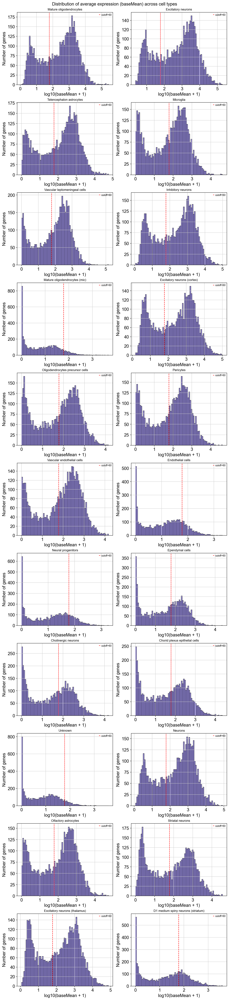

In [31]:
import matplotlib.pyplot as plt
import numpy as np

cutoff = 60
cells = list(results.keys())
n = len(cells)

# Choose grid layout
ncols = 2
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows), constrained_layout=True)

for ax, cell in zip(axes.flat, cells):
    df_hist = results[cell]['simple_effects'].get('60')
    if df_hist is None or 'baseMean' not in df_hist.columns:
        ax.set_visible(False)
        continue

    # Plot histogram
    ax.hist(np.log10(df_hist['baseMean'] + 1), bins=80, color='slateblue', edgecolor='black', alpha=0.7)
    ax.axvline(np.log10(cutoff), color='red', linestyle='--', lw=1.2, label=f'cutoff={cutoff}')
    ax.set_title(cell, fontsize=10)
    ax.set_xlabel('log10(baseMean + 1)')
    ax.set_ylabel('Number of genes')
    ax.legend(fontsize=8)

# Hide any unused axes
for i in range(len(cells), nrows * ncols):
    axes.flat[i].set_visible(False)

plt.suptitle("Distribution of average expression (baseMean) across cell types", fontsize=14)
plt.show()

2025-10-22 09:54:16 | [INFO] maxp pruned
2025-10-22 09:54:16 | [INFO] LTSH dropped
2025-10-22 09:54:16 | [INFO] cmap pruned
2025-10-22 09:54:16 | [INFO] kern dropped
2025-10-22 09:54:16 | [INFO] post pruned
2025-10-22 09:54:16 | [INFO] PCLT dropped
2025-10-22 09:54:16 | [INFO] JSTF dropped
2025-10-22 09:54:16 | [INFO] DSIG dropped
2025-10-22 09:54:16 | [INFO] GPOS pruned
2025-10-22 09:54:16 | [INFO] GSUB pruned
2025-10-22 09:54:16 | [INFO] glyf pruned
2025-10-22 09:54:16 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:16 | [INFO] Added gid0 to subset
2025-10-22 09:54:16 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:16 | [INFO] Closing glyph list over 'GSUB': 71 glyphs before
2025-10-22 09:54:16 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', '

💾 Saved: ../results/figures/Mature_oligodendrocytes_21w_vs_60w.{png, svg, pdf}


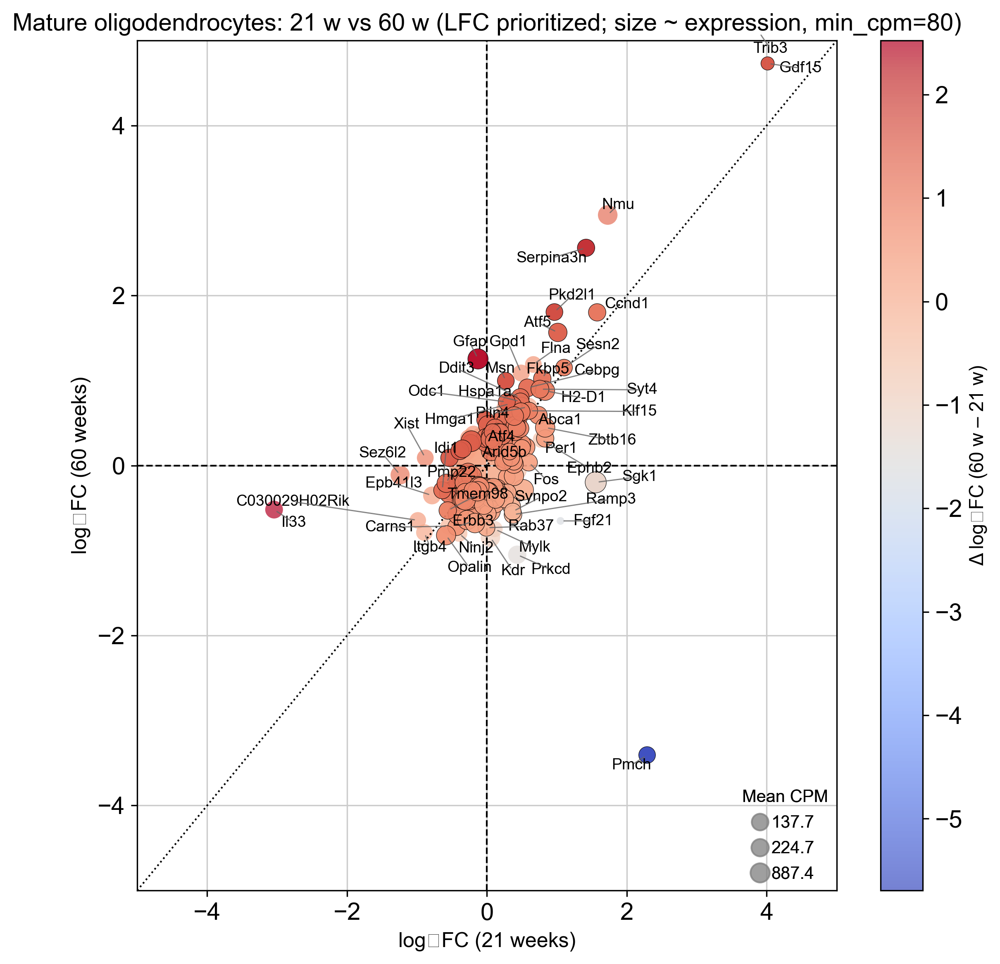

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Abca1,1385.648,0.734,0.518,1.419,0.156,1.000,181.867,1.0,137.824,225.910,165.622,198.111
Arid5b,2116.234,0.553,0.266,2.078,0.038,1.000,294.734,1.0,254.515,334.952,249.364,340.104
Atf5,1946.011,1.014,0.690,1.469,0.142,1.000,274.071,1.0,151.888,396.255,233.967,314.176
C030029H02Rik,1544.828,-0.988,0.570,-1.732,0.083,1.000,116.433,1.0,149.823,83.043,180.403,52.463
Carns1,1698.650,-0.547,0.334,-1.638,0.101,1.000,136.277,1.0,162.339,110.214,198.702,73.851
Cebpg,1265.670,0.580,0.338,1.714,0.087,1.000,178.622,1.0,128.445,228.798,151.148,206.095
Epb41l3,3654.460,-0.785,0.504,-1.556,0.120,1.000,311.145,1.0,374.301,247.990,426.858,195.432
Ephb2,650.923,0.772,0.651,1.187,0.235,1.000,107.249,1.0,87.511,126.988,78.032,136.466
Fgf21,4.115,1.052,1.031,1.020,0.308,1.000,0.470,1.0,0.431,0.510,0.489,0.452
Fkbp5,1091.824,0.791,0.308,2.565,0.010,1.000,143.926,1.0,97.925,189.927,129.033,158.819


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Atf5,2941.006,1.566,0.532,2.941,0.003,0.212,274.071,1.0,151.888,396.255,233.967,314.176
Carns1,714.648,-0.714,0.747,-0.956,0.339,1.000,136.277,1.0,162.339,110.214,198.702,73.851
Ccnd1,1269.982,1.802,0.650,2.770,0.006,0.290,133.410,1.0,60.809,206.011,130.688,136.131
Cebpg,1936.309,0.913,0.298,3.065,0.002,0.170,178.622,1.0,128.445,228.798,151.148,206.095
Ddit3,1920.128,0.799,0.236,3.382,0.001,0.098,179.605,1.0,135.742,223.468,155.313,203.896
Erbb3,1020.741,-0.722,0.318,-2.273,0.023,0.528,127.085,1.0,149.685,104.485,148.060,106.111
Fkbp5,1510.062,1.022,0.306,3.342,0.001,0.106,143.926,1.0,97.925,189.927,129.033,158.819
Flna,1465.044,1.189,0.625,1.901,0.057,0.748,138.303,1.0,91.242,185.364,119.168,157.438
Gdf15,107.994,4.730,1.450,3.263,0.001,0.128,11.420,1.0,1.050,21.789,11.603,11.236
Gfap,10401.411,1.254,0.277,4.535,0.000,0.006,1009.587,1.0,784.291,1234.883,908.238,1110.936


2025-10-22 09:54:18 | [INFO] maxp pruned
2025-10-22 09:54:18 | [INFO] LTSH dropped
2025-10-22 09:54:18 | [INFO] cmap pruned
2025-10-22 09:54:18 | [INFO] kern dropped
2025-10-22 09:54:18 | [INFO] post pruned
2025-10-22 09:54:18 | [INFO] PCLT dropped
2025-10-22 09:54:18 | [INFO] JSTF dropped
2025-10-22 09:54:18 | [INFO] DSIG dropped
2025-10-22 09:54:18 | [INFO] GPOS pruned
2025-10-22 09:54:18 | [INFO] GSUB pruned
2025-10-22 09:54:18 | [INFO] glyf pruned
2025-10-22 09:54:18 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:18 | [INFO] Added gid0 to subset
2025-10-22 09:54:18 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:18 | [INFO] Closing glyph list over 'GSUB': 68 glyphs before
2025-10-22 09:54:18 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'W', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Excitatory_neurons_21w_vs_60w.{png, svg, pdf}


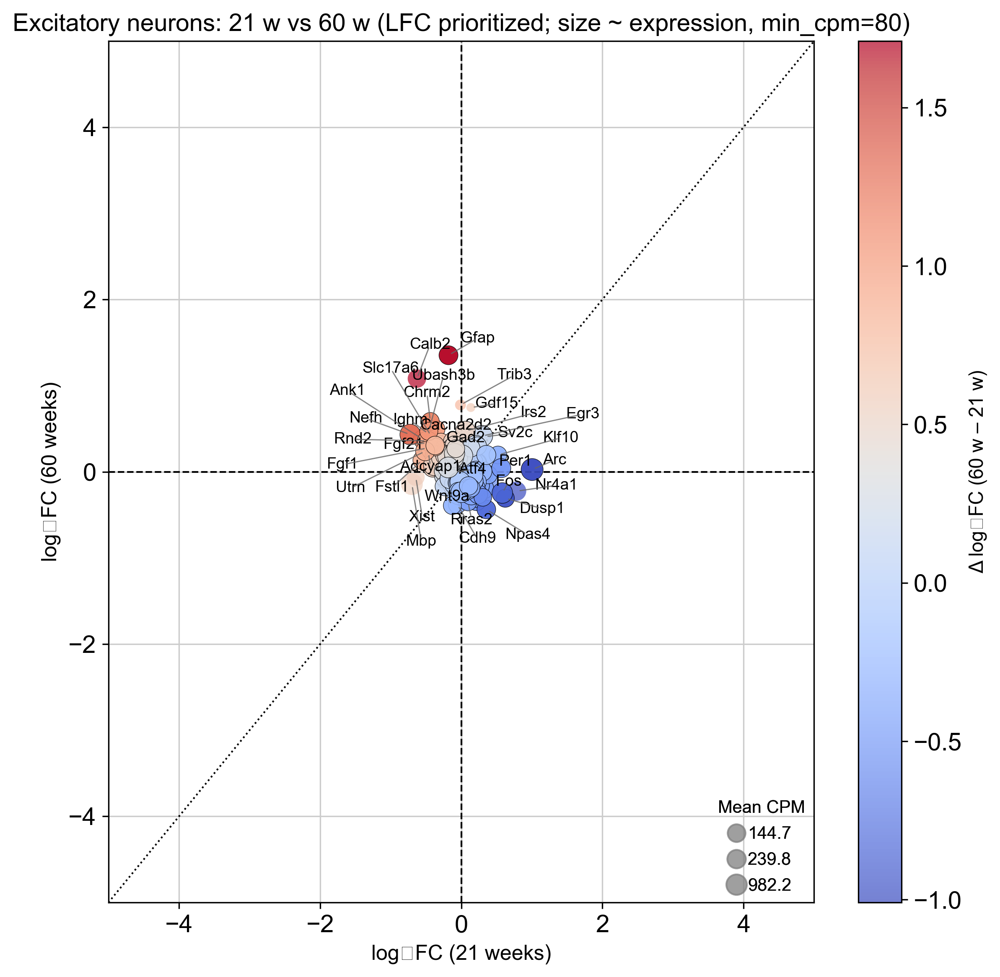

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,2812.804,-0.466,0.396,-1.177,0.239,1.0,166.317,1.0,172.846,159.789,169.391,163.243
Ank1,2049.544,-0.549,0.278,-1.971,0.049,1.0,125.196,1.0,128.627,121.765,124.332,126.059
Arc,12675.818,1.004,0.400,2.511,0.012,1.0,1494.279,1.0,1354.436,1634.122,766.589,2221.969
Calb2,4423.003,-0.628,0.542,-1.159,0.247,1.0,236.036,1.0,228.115,243.956,268.324,203.747
Chrm2,1618.516,-0.439,0.174,-2.520,0.012,1.0,94.188,1.0,92.318,96.059,97.770,90.607
Dusp1,1048.591,0.624,0.269,2.315,0.021,1.0,106.906,1.0,107.991,105.820,63.461,150.350
Fgf1,1530.484,-0.477,0.254,-1.881,0.060,1.0,91.276,1.0,94.627,87.924,92.844,89.708
Fgf21,6.698,-0.481,0.824,-0.583,0.560,1.0,0.375,1.0,0.391,0.358,0.406,0.343
Fos,4439.776,0.582,0.258,2.252,0.024,1.0,558.689,1.0,567.509,549.868,268.324,849.054
Fstl1,2521.293,-0.553,0.244,-2.271,0.023,1.0,143.098,1.0,154.454,131.743,152.793,133.404


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Ank1,2301.279,0.378,0.151,2.504,0.012,0.331,125.196,1.0,128.627,121.765,124.332,126.059
Cacna2d2,1743.258,0.494,0.151,3.264,0.001,0.104,105.160,1.0,104.109,106.212,114.940,95.381
Calb2,3705.890,1.082,0.599,1.806,0.071,0.580,236.036,1.0,228.115,243.956,268.324,203.747
Cdh9,1708.084,-0.380,0.122,-3.114,0.002,0.136,93.665,1.0,100.557,86.774,93.730,93.601
Chrm2,1653.549,0.585,0.132,4.424,0.000,0.005,94.188,1.0,92.318,96.059,97.770,90.607
Egr3,17790.818,0.415,0.127,3.275,0.001,0.103,883.219,1.0,770.863,995.575,792.395,974.042
Gad2,3980.746,0.349,0.404,0.865,0.387,0.868,228.803,1.0,219.414,238.192,240.021,217.584
Gdf15,15.900,0.746,0.626,1.192,0.233,NaN,0.903,1.0,0.776,1.031,0.932,0.874
Gfap,3910.211,1.353,0.205,6.592,0.000,0.000,184.180,1.0,142.384,225.975,154.024,214.335
Ighm,3013.643,0.441,0.715,0.617,0.537,0.926,134.522,1.0,130.390,138.655,104.727,164.318


2025-10-22 09:54:20 | [INFO] maxp pruned
2025-10-22 09:54:20 | [INFO] LTSH dropped
2025-10-22 09:54:20 | [INFO] cmap pruned
2025-10-22 09:54:20 | [INFO] kern dropped
2025-10-22 09:54:20 | [INFO] post pruned
2025-10-22 09:54:20 | [INFO] PCLT dropped
2025-10-22 09:54:20 | [INFO] JSTF dropped
2025-10-22 09:54:20 | [INFO] DSIG dropped
2025-10-22 09:54:20 | [INFO] GPOS pruned
2025-10-22 09:54:20 | [INFO] GSUB pruned
2025-10-22 09:54:20 | [INFO] glyf pruned
2025-10-22 09:54:20 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:20 | [INFO] Added gid0 to subset
2025-10-22 09:54:20 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:20 | [INFO] Closing glyph list over 'GSUB': 67 glyphs before
2025-10-22 09:54:20 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'J', 'L', 'M', 'O', 'P', 'R', 'S', 'T', 'U', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', '

💾 Saved: ../results/figures/Telencephalon_astrocytes_21w_vs_60w.{png, svg, pdf}


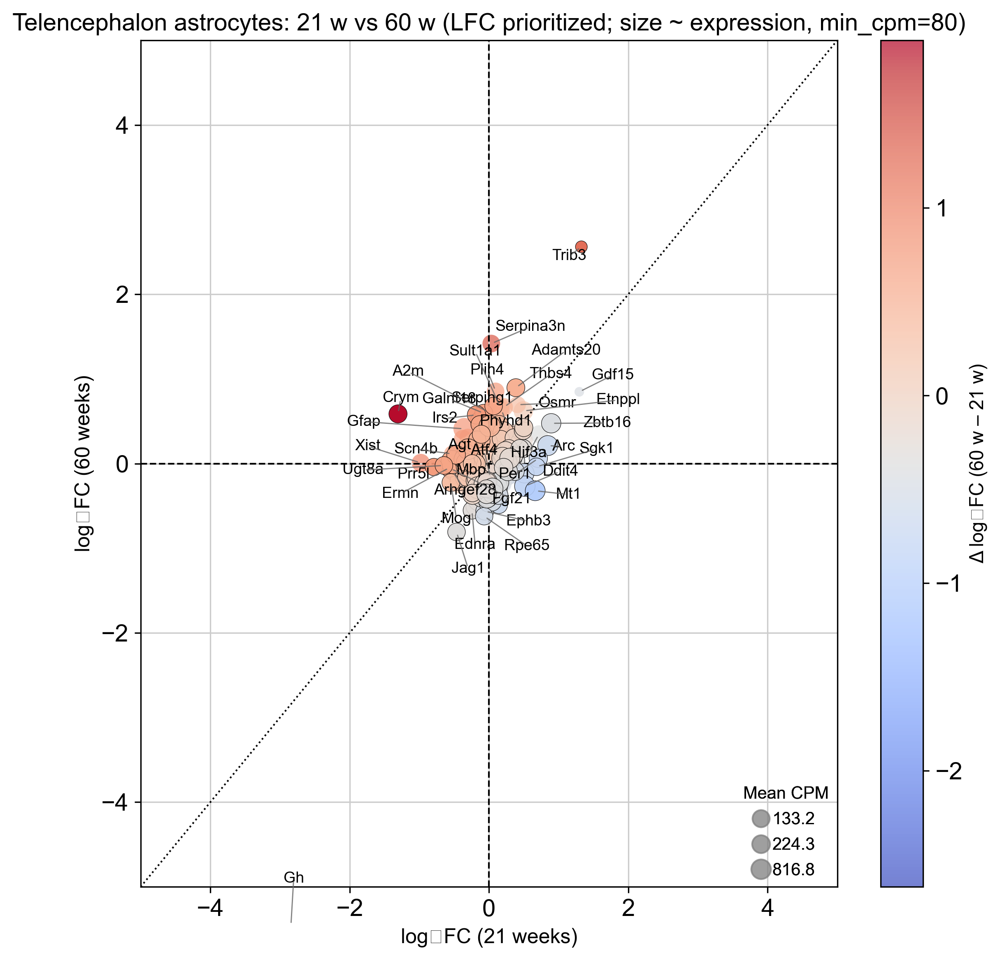

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arc,901.275,0.844,0.412,2.045,0.041,1.000,571.608,1.000,500.454,642.761,272.296,870.919
Arhgef28,388.410,-0.527,0.230,-2.286,0.022,1.000,109.650,1.000,121.675,97.624,117.096,102.204
Crym,665.876,-1.306,0.851,-1.534,0.125,1.000,164.785,1.000,194.493,135.077,201.063,128.507
Ddit4,2210.386,0.515,0.138,3.740,0.000,0.133,832.577,1.000,818.159,846.994,667.514,997.639
Ermn,1031.752,-0.565,0.189,-2.989,0.003,0.885,277.614,1.000,309.317,245.912,311.006,244.223
Fgf21,0.851,-0.555,2.430,-0.228,0.819,1.000,0.223,0.583,0.252,0.194,0.257,0.190
Gdf15,4.336,1.297,1.135,1.142,0.253,1.000,1.411,0.917,0.895,1.928,1.317,1.505
Gh,656.723,-2.843,1.691,-1.681,0.093,1.000,100.734,0.917,177.116,24.353,197.095,4.374
Hif3a,733.706,0.718,0.484,1.484,0.138,1.000,229.611,1.000,188.018,271.204,221.616,237.606
Mbp,23715.939,-0.522,0.160,-3.261,0.001,0.468,6870.836,1.000,7479.967,6261.705,7152.018,6589.654


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,913.620,0.609,0.489,1.246,0.213,1.000,250.903,1.000,226.136,275.670,272.081,229.725
Adamts20,559.359,0.896,0.237,3.782,0.000,0.099,139.243,1.000,108.534,169.953,138.256,140.231
Crym,512.854,0.587,0.235,2.500,0.012,1.000,164.785,1.000,194.493,135.077,201.063,128.507
Ednra,430.134,-0.553,0.127,-4.342,0.000,0.018,104.681,1.000,119.097,90.264,101.473,107.888
Ephb3,507.806,-0.562,0.128,-4.397,0.000,0.018,136.079,1.000,149.475,122.683,144.798,127.360
Etnppl,3579.542,0.622,0.479,1.299,0.194,1.000,812.005,1.000,653.869,970.141,727.242,896.768
Galnt18,502.523,0.595,0.199,2.991,0.003,0.471,136.765,1.000,125.503,148.027,147.630,125.900
Gdf15,6.004,0.848,0.826,1.027,0.304,1.000,1.411,0.917,0.895,1.928,1.317,1.505
Gh,17.337,-5.461,1.707,-3.200,0.001,0.327,100.734,0.917,177.116,24.353,197.095,4.374
Irs2,848.801,0.575,0.191,3.009,0.003,0.458,197.446,1.000,181.490,213.402,182.132,212.760


2025-10-22 09:54:22 | [INFO] maxp pruned
2025-10-22 09:54:22 | [INFO] LTSH dropped
2025-10-22 09:54:22 | [INFO] cmap pruned
2025-10-22 09:54:22 | [INFO] kern dropped
2025-10-22 09:54:22 | [INFO] post pruned
2025-10-22 09:54:22 | [INFO] PCLT dropped
2025-10-22 09:54:22 | [INFO] JSTF dropped
2025-10-22 09:54:22 | [INFO] DSIG dropped
2025-10-22 09:54:22 | [INFO] GPOS pruned
2025-10-22 09:54:22 | [INFO] GSUB pruned
2025-10-22 09:54:22 | [INFO] glyf pruned
2025-10-22 09:54:22 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:22 | [INFO] Added gid0 to subset
2025-10-22 09:54:22 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:22 | [INFO] Closing glyph list over 'GSUB': 65 glyphs before
2025-10-22 09:54:22 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'F', 'G', 'H', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'hyphen', 'i', 'j', '

💾 Saved: ../results/figures/Microglia_21w_vs_60w.{png, svg, pdf}


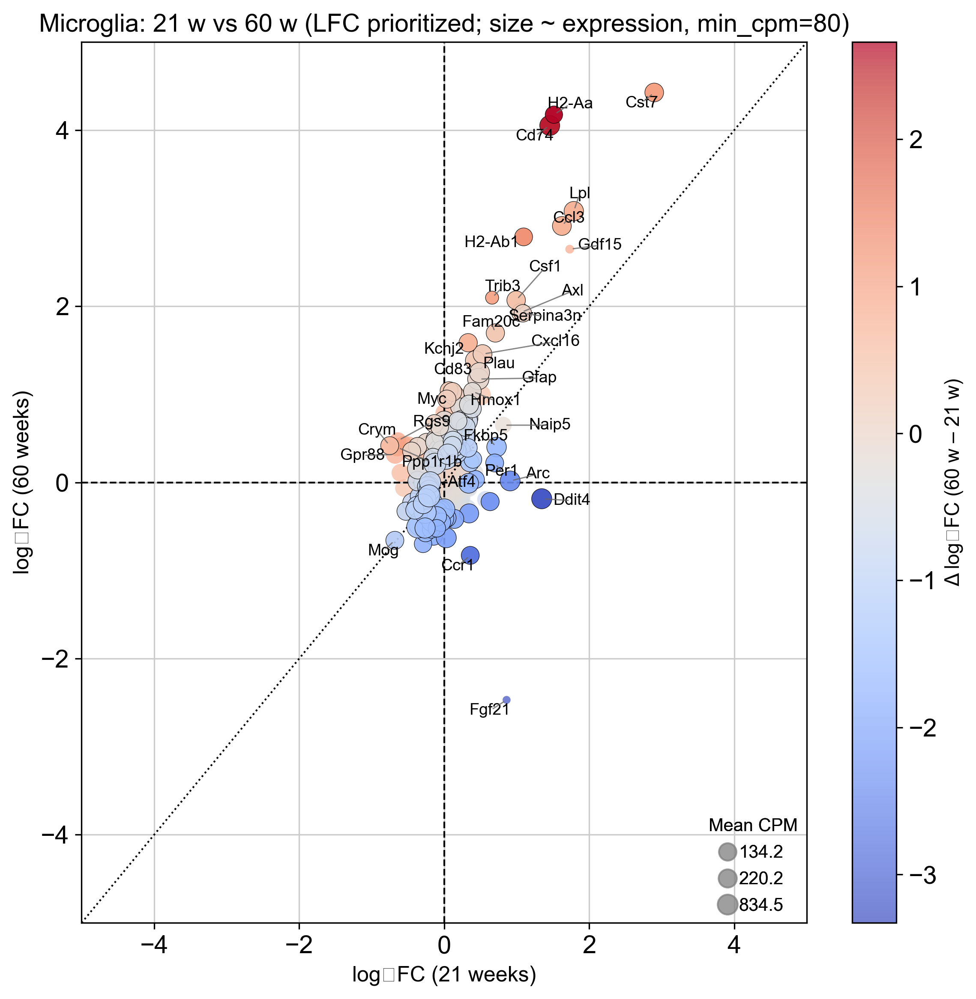

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arc,332.164,0.909,0.261,3.478,0.001,0.420,437.412,1.000,400.920,473.905,228.219,646.606
Axl,158.079,1.056,0.621,1.701,0.089,1.000,146.308,1.000,73.406,219.211,108.321,184.296
Ccl3,218.245,1.622,0.978,1.659,0.097,1.000,202.881,1.000,66.463,339.299,149.532,256.231
Crym,192.173,-0.752,0.278,-2.702,0.007,1.000,116.525,1.000,125.481,107.570,131.186,101.865
Csf1,181.310,0.992,0.677,1.465,0.143,1.000,164.075,1.000,80.683,247.468,124.167,203.984
Cst7,135.383,2.896,1.086,2.666,0.008,1.000,185.679,1.000,23.343,348.015,92.955,278.404
Ddit4,627.402,1.344,0.221,6.089,0.000,0.000,491.392,1.000,414.670,568.114,431.714,551.070
Fam20c,159.743,0.705,0.304,2.319,0.020,1.000,144.543,1.000,83.796,205.289,109.385,179.700
Fgf21,0.146,0.860,4.427,0.194,0.846,1.000,0.324,0.417,0.447,0.202,0.100,0.548
Fkbp5,439.834,0.722,0.195,3.700,0.000,0.215,337.701,1.000,274.316,401.086,301.847,373.556


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Axl,337.023,1.928,0.689,2.797,0.005,0.441,146.308,1.000,73.406,219.211,108.321,184.296
Ccl3,469.745,2.911,1.287,2.263,0.024,0.910,202.881,1.000,66.463,339.299,149.532,256.231
Cd74,1206.373,4.051,1.160,3.492,0.000,0.242,448.250,1.000,100.903,795.596,238.628,657.871
Cd83,660.265,1.385,0.539,2.567,0.010,0.616,306.900,1.000,207.282,406.518,252.360,361.440
Csf1,373.231,2.068,0.826,2.504,0.012,0.710,164.075,1.000,80.683,247.468,124.167,203.984
Cst7,510.649,4.426,1.254,3.530,0.000,0.239,185.679,1.000,23.343,348.015,92.955,278.404
Cxcl16,457.586,1.457,0.631,2.308,0.021,0.877,209.351,1.000,135.516,283.185,168.298,250.403
Fam20c,328.596,1.696,0.693,2.448,0.014,0.772,144.543,1.000,83.796,205.289,109.385,179.700
Fgf21,0.995,-2.469,2.219,-1.113,0.266,0.999,0.324,0.417,0.447,0.202,0.100,0.548
Gdf15,1.618,2.648,2.138,1.239,0.215,0.999,0.719,0.500,0.247,1.191,0.554,0.884


2025-10-22 09:54:24 | [INFO] maxp pruned
2025-10-22 09:54:24 | [INFO] LTSH dropped
2025-10-22 09:54:24 | [INFO] cmap pruned
2025-10-22 09:54:24 | [INFO] kern dropped
2025-10-22 09:54:24 | [INFO] post pruned
2025-10-22 09:54:24 | [INFO] PCLT dropped
2025-10-22 09:54:24 | [INFO] JSTF dropped
2025-10-22 09:54:24 | [INFO] DSIG dropped
2025-10-22 09:54:24 | [INFO] GPOS pruned
2025-10-22 09:54:24 | [INFO] GSUB pruned
2025-10-22 09:54:24 | [INFO] glyf pruned
2025-10-22 09:54:24 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:24 | [INFO] Added gid0 to subset
2025-10-22 09:54:24 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:24 | [INFO] Closing glyph list over 'GSUB': 67 glyphs before
2025-10-22 09:54:24 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', '

💾 Saved: ../results/figures/Vascular_leptomeningeal_cells_21w_vs_60w.{png, svg, pdf}


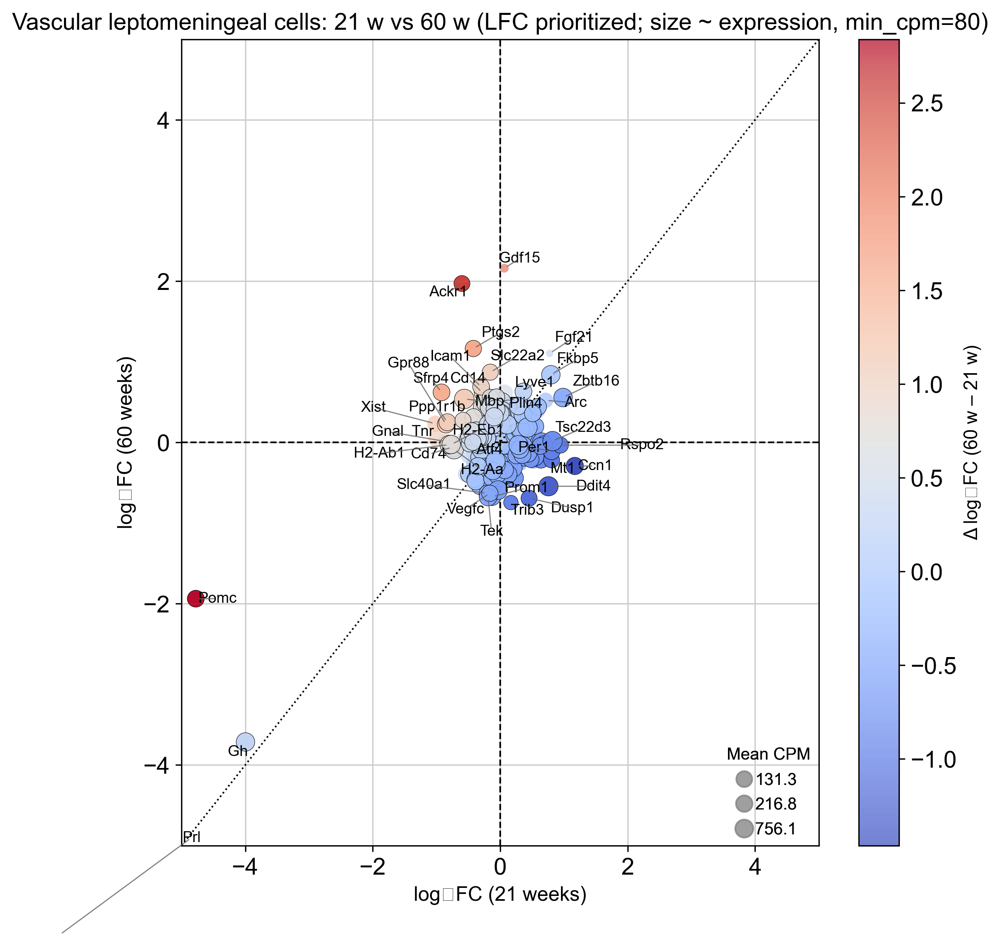

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arc,90.804,0.714,0.403,1.771,0.076,1.000,80.756,1.000,65.161,96.352,43.227,118.285
Ccn1,399.064,1.171,0.304,3.849,0.000,0.077,230.660,1.000,208.508,252.812,189.418,271.902
Cd74,3252.164,-0.748,0.268,-2.788,0.005,0.699,1540.588,1.000,1751.486,1329.689,1536.168,1545.008
Ddit4,1989.847,0.759,0.156,4.852,0.000,0.002,1165.284,1.000,1173.790,1156.778,944.112,1386.455
Fgf21,0.174,0.777,4.430,0.175,0.861,1.000,0.088,0.167,0.000,0.175,0.083,0.092
Fkbp5,1267.278,0.796,0.531,1.499,0.134,1.000,603.973,1.000,437.645,770.301,602.244,605.702
Gh,2160.065,-3.997,1.596,-2.505,0.012,1.000,578.712,1.000,1087.340,70.085,1021.559,135.866
Gnal,267.994,-0.854,0.694,-1.231,0.218,1.000,116.143,1.000,134.630,97.656,127.713,104.572
Gpr88,468.172,-0.850,0.323,-2.633,0.008,0.903,204.837,1.000,229.758,179.916,222.602,187.072
H2-Aa,1643.388,-0.724,0.294,-2.458,0.014,1.000,778.492,1.000,885.823,671.162,775.578,781.407


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Ackr1,290.897,1.971,0.994,1.982,0.047,0.999,83.567,1.000,49.655,117.479,38.590,128.544
Cd14,244.962,0.617,0.189,3.261,0.001,0.368,105.936,1.000,99.407,112.465,102.905,108.967
Dusp1,242.445,-0.692,0.307,-2.249,0.025,0.999,88.832,1.000,96.181,81.483,69.256,108.408
Fgf21,0.205,1.105,4.352,0.254,0.800,0.999,0.088,0.167,0.000,0.175,0.083,0.092
Fkbp5,1359.177,0.839,0.390,2.149,0.032,0.999,603.973,1.000,437.645,770.301,602.244,605.702
Gdf15,1.165,2.160,2.164,0.998,0.318,0.999,0.815,0.750,0.632,0.998,1.116,0.514
Gh,301.766,-3.715,1.591,-2.335,0.020,0.999,578.712,1.000,1087.340,70.085,1021.559,135.866
Icam1,386.022,0.691,0.269,2.572,0.010,0.869,152.694,1.000,139.564,165.825,133.631,171.758
Lyve1,403.807,0.632,0.205,3.075,0.002,0.527,168.519,1.000,139.296,197.741,157.253,179.784
Plin4,617.092,0.615,0.527,1.167,0.243,0.999,294.359,1.000,261.046,327.672,313.468,275.251


2025-10-22 09:54:26 | [INFO] maxp pruned
2025-10-22 09:54:26 | [INFO] LTSH dropped
2025-10-22 09:54:26 | [INFO] cmap pruned
2025-10-22 09:54:26 | [INFO] kern dropped
2025-10-22 09:54:26 | [INFO] post pruned
2025-10-22 09:54:26 | [INFO] PCLT dropped
2025-10-22 09:54:26 | [INFO] JSTF dropped
2025-10-22 09:54:26 | [INFO] DSIG dropped
2025-10-22 09:54:26 | [INFO] GPOS pruned
2025-10-22 09:54:26 | [INFO] GSUB pruned
2025-10-22 09:54:26 | [INFO] glyf pruned
2025-10-22 09:54:26 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:26 | [INFO] Added gid0 to subset
2025-10-22 09:54:26 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:26 | [INFO] Closing glyph list over 'GSUB': 68 glyphs before
2025-10-22 09:54:26 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'Delta', 'E', 'F', 'G', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', '

💾 Saved: ../results/figures/Inhibitory_neurons_21w_vs_60w.{png, svg, pdf}


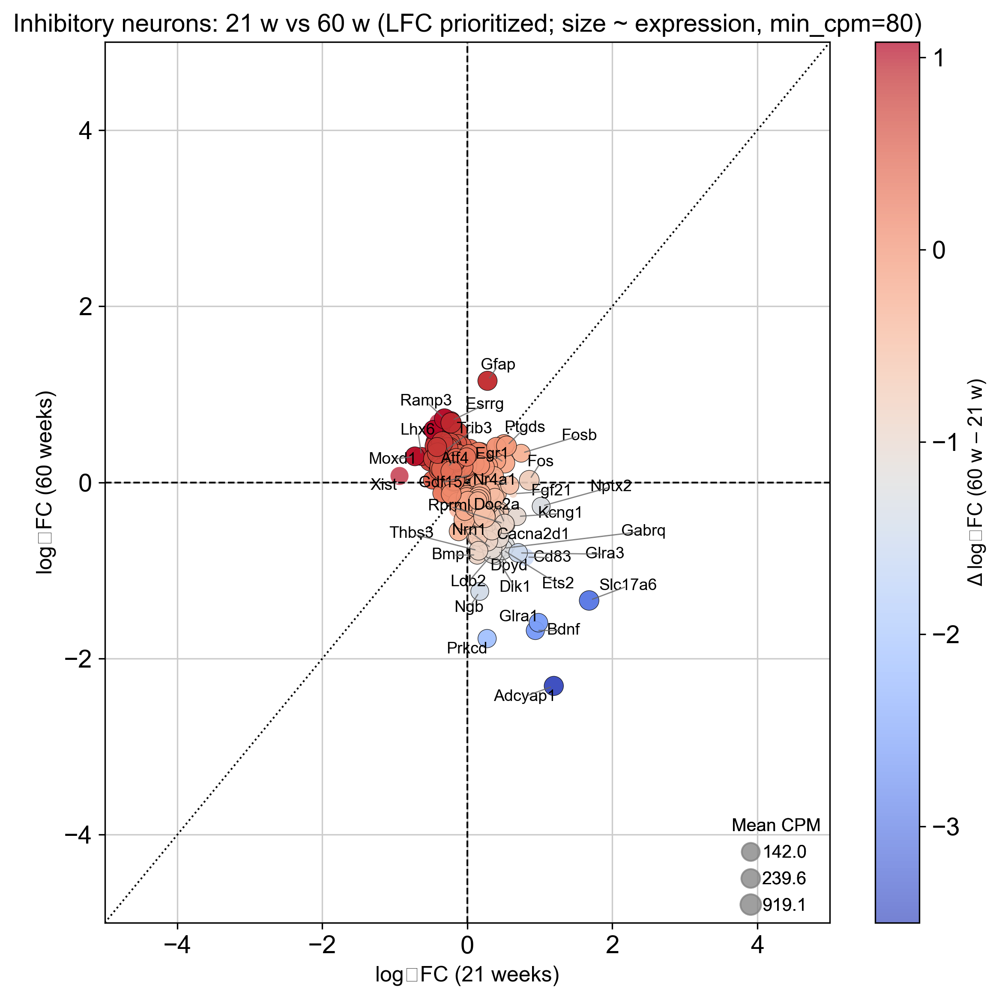

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,1603.018,1.192,1.043,1.143,0.253,0.999,198.639,1.000,220.856,176.423,206.307,190.971
Bdnf,788.565,0.937,0.689,1.361,0.174,0.999,107.457,1.000,120.852,94.061,101.635,113.279
Cacna2d1,1822.444,0.517,0.193,2.678,0.007,0.349,223.185,1.000,227.580,218.790,235.094,211.276
Cd83,928.687,0.799,0.538,1.486,0.137,0.999,119.559,1.000,120.118,118.999,119.779,119.338
Doc2a,2209.455,0.521,0.199,2.613,0.009,0.385,267.716,1.000,261.903,273.529,284.947,250.485
Egr1,2017.775,0.517,0.146,3.529,0.000,0.071,322.771,1.000,284.359,361.184,260.329,385.213
Fgf21,2.359,0.630,1.414,0.446,0.656,0.999,0.345,0.917,0.328,0.362,0.306,0.384
Fos,1323.054,0.854,0.210,4.059,0.000,0.017,280.217,1.000,253.526,306.909,170.873,389.562
Fosb,478.572,0.743,0.238,3.118,0.002,0.165,86.856,1.000,72.561,101.151,61.805,111.907
Glra1,1154.172,0.981,0.853,1.150,0.250,0.999,137.132,1.000,143.890,130.374,148.770,125.493


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,1430.949,-2.310,0.391,-5.915,0.000,0.000,198.639,1.0,220.856,176.423,206.307,190.971
Bdnf,850.303,-1.681,0.180,-9.357,0.000,0.000,107.457,1.0,120.852,94.061,101.635,113.279
Bmp1,897.912,-0.824,0.155,-5.302,0.000,0.000,122.594,1.0,136.039,109.148,125.573,119.615
Cacna2d1,1584.265,-0.720,0.148,-4.862,0.000,0.000,223.185,1.0,227.580,218.790,235.094,211.276
Cd83,895.150,-0.848,0.476,-1.781,0.075,0.406,119.559,1.0,120.118,118.999,119.779,119.338
Dlk1,548.322,-0.832,0.415,-2.005,0.045,0.319,81.020,1.0,85.072,76.968,88.919,73.122
Dpyd,629.152,-0.760,0.136,-5.578,0.000,0.000,85.089,1.0,89.446,80.732,86.294,83.885
Esrrg,1286.972,0.698,0.129,5.404,0.000,0.000,160.802,1.0,146.299,175.304,150.119,171.485
Ets2,3207.734,-0.761,0.116,-6.558,0.000,0.000,457.102,1.0,471.084,443.120,486.699,427.505
Gabrq,588.599,-0.749,0.486,-1.542,0.123,0.519,90.532,1.0,91.773,89.291,102.585,78.479


2025-10-22 09:54:27 | [INFO] maxp pruned
2025-10-22 09:54:27 | [INFO] LTSH dropped
2025-10-22 09:54:27 | [INFO] cmap pruned
2025-10-22 09:54:27 | [INFO] kern dropped
2025-10-22 09:54:27 | [INFO] post pruned
2025-10-22 09:54:27 | [INFO] PCLT dropped
2025-10-22 09:54:27 | [INFO] JSTF dropped
2025-10-22 09:54:27 | [INFO] DSIG dropped
2025-10-22 09:54:27 | [INFO] GPOS pruned
2025-10-22 09:54:27 | [INFO] GSUB pruned
2025-10-22 09:54:27 | [INFO] glyf pruned
2025-10-22 09:54:27 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:27 | [INFO] Added gid0 to subset
2025-10-22 09:54:27 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:27 | [INFO] Closing glyph list over 'GSUB': 69 glyphs before
2025-10-22 09:54:27 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Mature_oligodendrocytes_(mic)_21w_vs_60w.{png, svg, pdf}


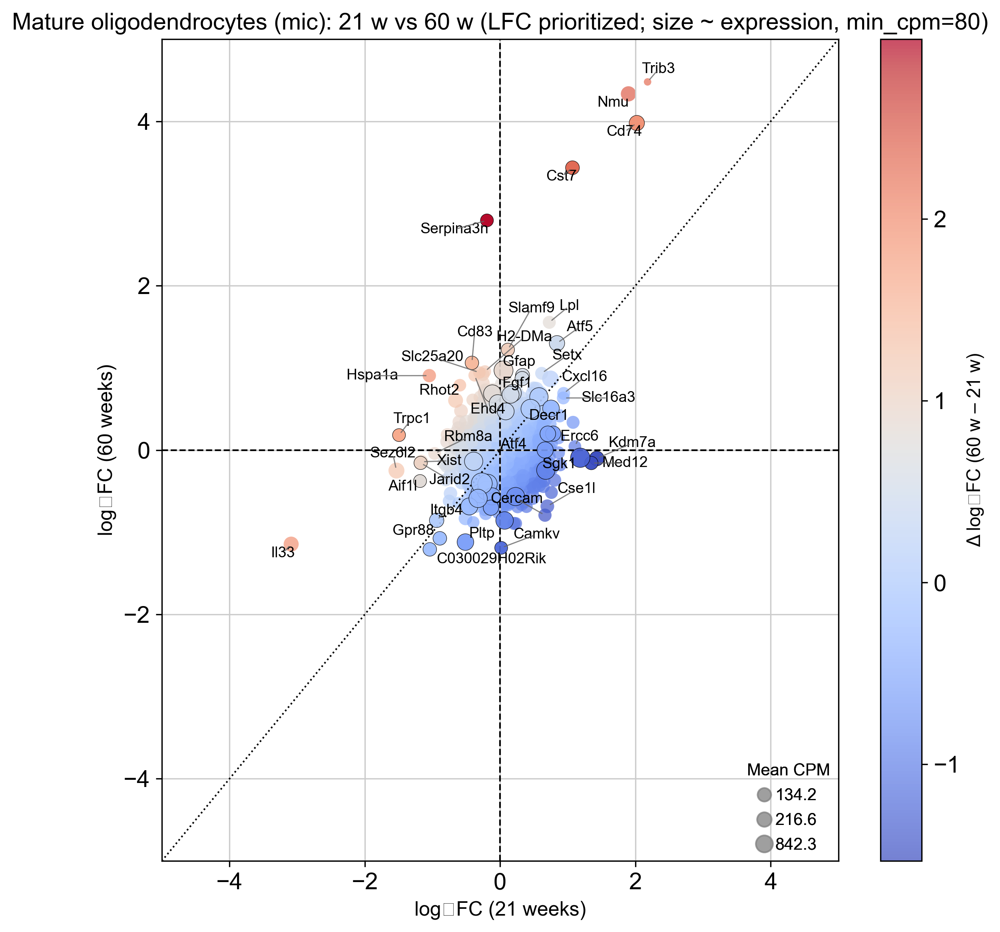

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Aif1l,10.941,-1.183,0.594,-1.992,0.046,1.0,81.441,1.000,101.409,61.473,91.189,71.693
C030029H02Rik,20.115,-1.039,0.515,-2.019,0.044,1.0,106.620,0.917,142.857,70.383,165.476,47.764
Cd74,15.978,2.021,0.645,3.133,0.002,1.0,228.058,1.000,43.889,412.226,136.391,319.724
Cst7,4.089,1.070,1.084,0.986,0.324,1.0,117.523,1.000,27.115,207.931,34.963,200.082
Cxcl16,11.133,0.939,0.585,1.607,0.108,1.0,100.878,1.000,70.104,131.651,93.883,107.873
Decr1,10.453,1.078,0.584,1.846,0.065,1.0,107.612,1.000,82.017,133.208,88.159,127.065
Ercc6,9.860,1.106,0.648,1.706,0.088,1.0,92.735,1.000,73.466,112.003,83.620,101.849
Hspa1a,4.598,-1.046,0.911,-1.148,0.251,1.0,125.969,0.917,99.213,152.724,38.240,213.697
Itgb4,25.320,-0.938,0.476,-1.971,0.049,1.0,158.213,1.000,204.458,111.968,208.608,107.817
Jarid2,12.263,-1.175,0.565,-2.079,0.038,1.0,93.880,1.000,115.996,71.764,101.355,86.406


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Atf5,37.969,1.300,0.423,3.073,0.002,1.0,237.081,1.000,144.635,329.527,197.829,276.333
C030029H02Rik,6.753,-1.208,0.841,-1.436,0.151,1.0,106.620,0.917,142.857,70.383,165.476,47.764
Camkv,11.532,-1.190,0.586,-2.031,0.042,1.0,80.236,1.000,97.705,62.768,77.047,83.425
Cd74,42.971,3.980,1.165,3.416,0.001,1.0,228.058,1.000,43.889,412.226,136.391,319.724
Cd83,15.719,1.061,0.524,2.027,0.043,1.0,102.867,1.000,85.642,120.092,91.103,114.630
Cst7,26.702,3.435,1.525,2.253,0.024,1.0,117.523,1.000,27.115,207.931,34.963,200.082
Ehd4,11.665,0.909,0.574,1.584,0.113,1.0,83.404,1.000,73.898,92.910,81.844,84.964
Fgf1,12.414,0.920,0.541,1.702,0.089,1.0,115.064,1.000,105.693,124.435,139.372,90.756
Gfap,262.886,0.969,0.418,2.318,0.020,1.0,1761.195,1.000,1411.350,2111.040,1603.466,1918.924
Gpr88,13.290,-1.074,0.518,-2.075,0.038,1.0,109.391,1.000,144.904,73.878,122.800,95.983


2025-10-22 09:54:29 | [INFO] maxp pruned
2025-10-22 09:54:29 | [INFO] LTSH dropped
2025-10-22 09:54:29 | [INFO] cmap pruned
2025-10-22 09:54:29 | [INFO] kern dropped
2025-10-22 09:54:29 | [INFO] post pruned
2025-10-22 09:54:29 | [INFO] PCLT dropped
2025-10-22 09:54:29 | [INFO] JSTF dropped
2025-10-22 09:54:29 | [INFO] DSIG dropped
2025-10-22 09:54:29 | [INFO] GPOS pruned
2025-10-22 09:54:29 | [INFO] GSUB pruned
2025-10-22 09:54:29 | [INFO] glyf pruned
2025-10-22 09:54:29 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:29 | [INFO] Added gid0 to subset
2025-10-22 09:54:29 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:29 | [INFO] Closing glyph list over 'GSUB': 67 glyphs before
2025-10-22 09:54:29 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'Delta', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'W', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Excitatory_neurons_(cortex)_21w_vs_60w.{png, svg, pdf}


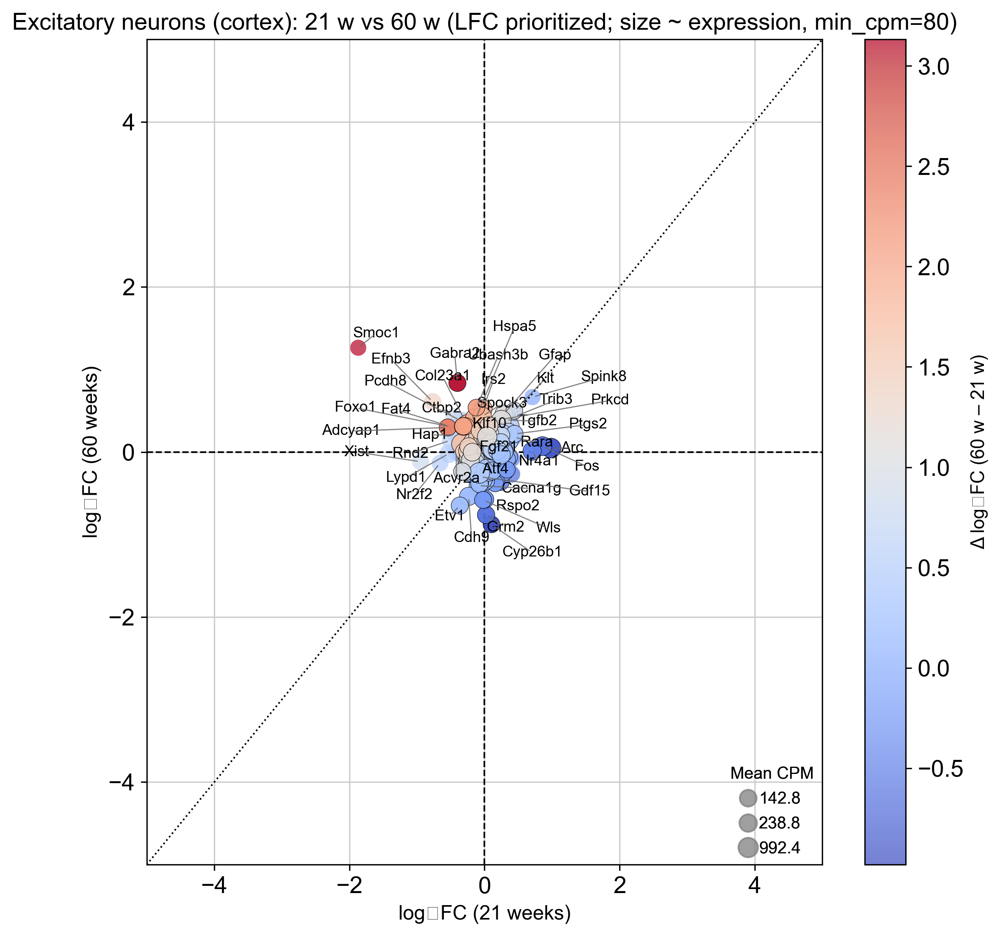

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Acvr2a,6475.563,-0.418,0.310,-1.346,0.178,1.000,665.039,1.0,715.059,615.019,674.647,655.431
Adcyap1,1013.883,-0.544,0.186,-2.929,0.003,0.904,101.192,1.0,106.414,95.969,105.478,96.905
Arc,3706.032,0.985,0.338,2.916,0.004,0.904,591.406,1.0,524.761,658.051,384.786,798.026
Ctbp2,787.101,-0.464,0.622,-0.746,0.455,1.000,89.535,1.0,89.410,89.661,82.277,96.794
Efnb3,2077.153,-0.768,0.588,-1.306,0.192,1.000,197.407,1.0,207.833,186.980,216.886,177.927
Fat4,984.943,-0.530,0.339,-1.562,0.118,1.000,100.396,1.0,104.772,96.020,102.707,98.086
Fos,2040.789,0.857,0.339,2.530,0.011,1.000,352.269,1.0,317.221,387.317,211.989,492.548
Foxo1,830.269,-0.494,0.366,-1.350,0.177,1.000,84.243,1.0,87.616,80.871,86.650,81.837
Hap1,2848.293,-0.422,0.509,-0.831,0.406,1.000,291.547,1.0,303.726,279.368,296.304,286.790
Kit,826.074,0.441,0.172,2.561,0.010,1.000,89.249,1.0,75.382,103.116,85.842,92.655


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cacna1g,1286.462,-0.408,0.141,-2.895,0.004,0.483,139.776,1.0,152.667,126.885,137.620,141.931
Cdh9,1820.652,-0.537,0.213,-2.529,0.011,0.726,212.171,1.0,240.640,183.702,223.053,201.288
Ctbp2,878.075,0.432,0.268,1.615,0.106,1.000,89.535,1.0,89.410,89.661,82.277,96.794
Cyp26b1,841.336,-0.878,0.258,-3.403,0.001,0.236,84.732,1.0,97.428,72.036,76.519,92.945
Efnb3,1612.265,0.609,0.693,0.879,0.379,1.000,197.407,1.0,207.833,186.980,216.886,177.927
Etv1,1023.607,-0.649,0.245,-2.648,0.008,0.703,112.390,1.0,132.261,92.519,111.764,113.016
Gabra2,1044.912,0.837,0.220,3.796,0.000,0.125,108.842,1.0,100.066,117.617,102.694,114.989
Gfap,1677.251,0.461,0.152,3.044,0.002,0.405,154.733,1.0,134.964,174.502,125.031,184.435
Grm2,1159.351,-0.762,0.162,-4.696,0.000,0.003,128.835,1.0,144.896,112.773,129.754,127.915
Hspa5,10550.644,0.404,0.149,2.706,0.007,0.696,1080.498,1.0,1027.210,1133.786,999.648,1161.347


2025-10-22 09:54:31 | [INFO] maxp pruned
2025-10-22 09:54:31 | [INFO] LTSH dropped
2025-10-22 09:54:31 | [INFO] cmap pruned
2025-10-22 09:54:31 | [INFO] kern dropped
2025-10-22 09:54:31 | [INFO] post pruned
2025-10-22 09:54:31 | [INFO] PCLT dropped
2025-10-22 09:54:31 | [INFO] JSTF dropped
2025-10-22 09:54:31 | [INFO] DSIG dropped
2025-10-22 09:54:31 | [INFO] GPOS pruned
2025-10-22 09:54:31 | [INFO] GSUB pruned
2025-10-22 09:54:31 | [INFO] glyf pruned
2025-10-22 09:54:31 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:31 | [INFO] Added gid0 to subset
2025-10-22 09:54:31 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:31 | [INFO] Closing glyph list over 'GSUB': 67 glyphs before
2025-10-22 09:54:31 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'Delta', 'E', 'F', 'G', 'H', 'I', 'J', 'L', 'M', 'O', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Oligodendrocytes_precursor_cells_21w_vs_60w.{png, svg, pdf}


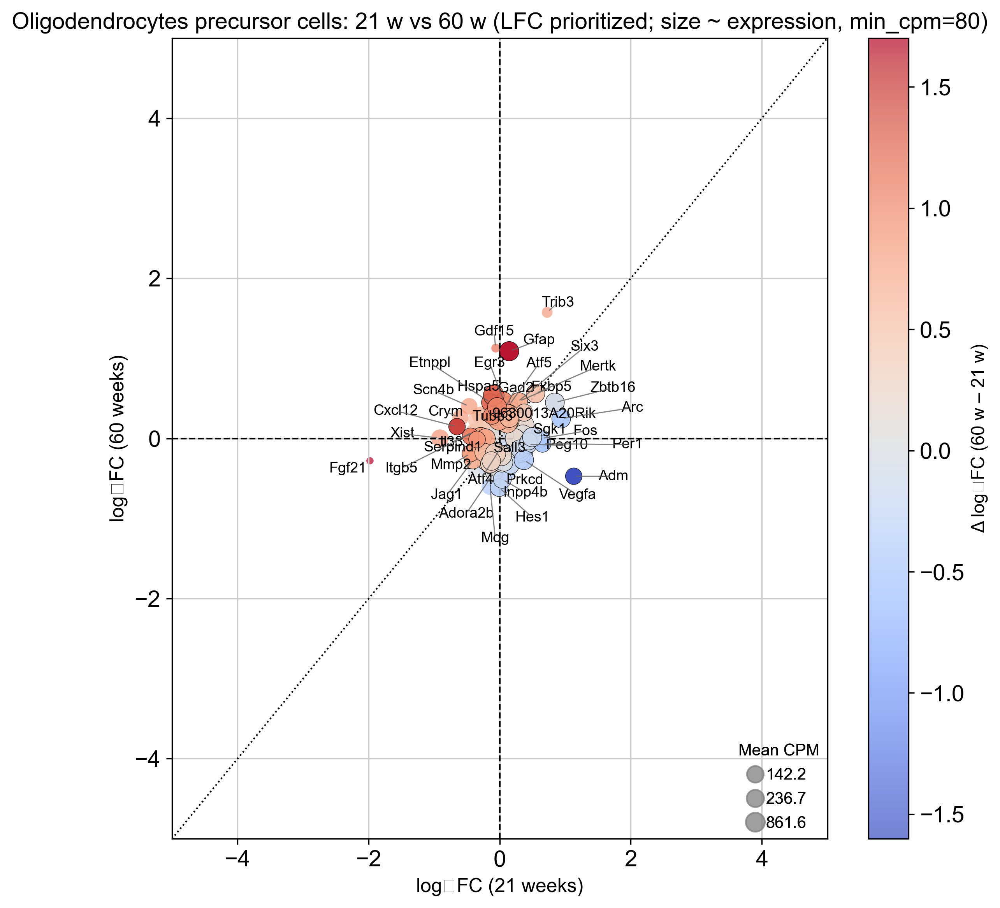

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
9630013A20Rik,179.595,0.392,0.167,2.349,0.019,1.000,116.411,1.000,104.754,128.067,114.788,118.034
Adm,114.795,1.130,0.225,5.016,0.000,0.001,80.886,1.000,74.240,87.533,73.386,88.386
Arc,286.422,0.938,0.345,2.719,0.007,1.000,334.932,1.000,285.861,384.004,183.039,486.826
Crym,171.159,-0.600,0.415,-1.446,0.148,1.000,101.273,1.000,108.224,94.323,109.158,93.389
Cxcl12,128.129,-0.651,0.195,-3.347,0.001,0.584,81.232,1.000,88.554,73.910,81.798,80.666
Fgf21,0.369,-1.980,3.762,-0.526,0.599,1.000,0.234,0.250,0.347,0.120,0.234,0.233
Fos,115.012,0.631,0.260,2.427,0.015,1.000,125.334,1.000,117.474,133.194,73.453,177.216
Il33,127.576,-0.397,0.489,-0.811,0.417,1.000,83.296,1.000,87.932,78.660,81.602,84.990
Itgb5,138.253,-0.380,0.205,-1.860,0.063,1.000,101.491,1.000,105.897,97.085,88.190,114.791
Jag1,296.232,-0.407,0.153,-2.668,0.008,1.000,165.294,1.000,185.018,145.570,189.329,141.258


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adm,141.112,-0.472,0.199,-2.366,0.018,1.000,80.886,1.000,74.240,87.533,73.386,88.386
Adora2b,204.749,-0.425,0.154,-2.761,0.006,1.000,124.014,1.000,135.173,112.854,119.843,128.185
Atf5,221.032,0.416,0.153,2.717,0.007,1.000,133.124,1.000,119.952,146.295,127.919,138.328
Egr3,297.725,0.469,0.146,3.210,0.001,0.742,177.514,1.000,160.761,194.268,168.761,186.267
Etnppl,329.750,0.449,0.162,2.778,0.005,1.000,181.701,1.000,170.054,193.349,157.366,206.037
Fkbp5,268.104,0.463,0.178,2.608,0.009,1.000,159.663,1.000,138.704,180.622,151.451,167.874
Gad2,444.928,0.393,0.398,0.989,0.323,1.000,276.270,1.000,253.661,298.879,274.574,277.966
Gdf15,1.151,1.129,1.806,0.625,0.532,1.000,1.107,0.833,1.000,1.214,1.496,0.718
Gfap,1030.120,1.090,0.365,2.983,0.003,1.000,550.098,1.000,421.688,678.508,454.445,645.751
Hes1,261.210,-0.614,0.161,-3.804,0.000,0.143,168.905,1.000,186.200,151.610,174.158,163.652


2025-10-22 09:54:33 | [INFO] maxp pruned
2025-10-22 09:54:33 | [INFO] LTSH dropped
2025-10-22 09:54:33 | [INFO] cmap pruned
2025-10-22 09:54:33 | [INFO] kern dropped
2025-10-22 09:54:33 | [INFO] post pruned
2025-10-22 09:54:33 | [INFO] PCLT dropped
2025-10-22 09:54:33 | [INFO] JSTF dropped
2025-10-22 09:54:33 | [INFO] DSIG dropped
2025-10-22 09:54:33 | [INFO] GPOS pruned
2025-10-22 09:54:33 | [INFO] GSUB pruned
2025-10-22 09:54:33 | [INFO] glyf pruned
2025-10-22 09:54:33 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:33 | [INFO] Added gid0 to subset
2025-10-22 09:54:33 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:33 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-22 09:54:33 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'P', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', '

💾 Saved: ../results/figures/Pericytes_21w_vs_60w.{png, svg, pdf}


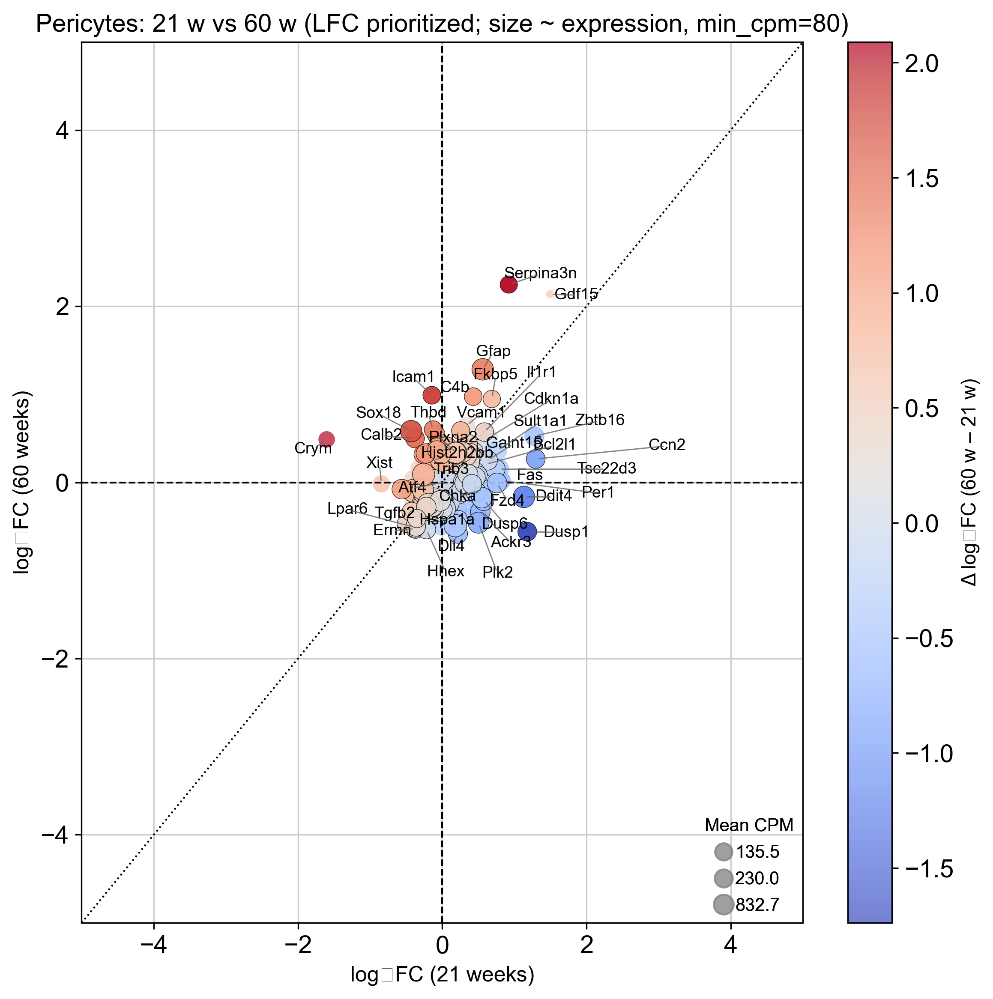

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Bcl2l1,1477.764,0.600,0.154,3.890,0.000,0.063,778.411,1.000,672.373,884.449,767.200,789.622
Ccn2,438.342,1.296,0.411,3.153,0.002,0.449,213.607,1.000,156.764,270.450,227.617,199.597
Cdkn1a,149.383,0.656,0.630,1.041,0.298,1.000,86.176,1.000,69.301,103.052,77.420,94.933
Chka,430.805,0.575,0.157,3.661,0.000,0.125,230.916,1.000,212.275,249.556,223.662,238.169
Crym,196.675,-1.602,0.928,-1.727,0.084,1.000,81.867,1.000,102.641,61.093,102.383,61.351
Ddit4,2268.084,1.132,0.143,7.922,0.000,0.000,1358.254,1.000,1183.380,1533.127,1177.095,1539.412
Dusp1,253.203,1.179,0.199,5.932,0.000,0.000,198.836,1.000,198.892,198.779,131.327,266.344
Dusp6,1023.437,0.576,0.146,3.940,0.000,0.058,638.982,1.000,612.983,664.982,531.238,746.726
Fas,560.232,0.737,0.191,3.853,0.000,0.065,312.944,1.000,267.981,357.906,290.695,335.192
Fkbp5,157.170,0.687,0.279,2.467,0.014,1.000,86.901,1.000,62.892,110.909,81.533,92.268


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
C4b,274.249,0.974,0.478,2.038,0.042,1.000,107.323,1.000,80.847,133.798,94.368,120.277
Cdkn1a,217.192,0.513,0.507,1.012,0.312,1.000,86.176,1.000,69.301,103.052,77.420,94.933
Dll4,574.024,-0.582,0.150,-3.891,0.000,0.081,266.100,1.000,280.827,251.372,280.485,251.715
Dusp1,607.588,-0.559,0.385,-1.451,0.147,1.000,198.836,1.000,198.892,198.779,131.327,266.344
Ermn,710.035,-0.524,0.415,-1.261,0.207,1.000,329.374,1.000,379.849,278.899,347.394,311.354
Fkbp5,210.880,0.947,0.231,4.105,0.000,0.041,86.901,1.000,62.892,110.909,81.533,92.268
Gdf15,1.056,2.137,2.226,0.960,0.337,1.000,0.781,0.583,0.376,1.185,1.102,0.460
Gfap,3484.621,1.284,0.494,2.596,0.009,1.000,1346.961,1.000,915.731,1778.192,1164.235,1529.688
Hhex,378.022,-0.535,0.144,-3.702,0.000,0.113,178.093,1.000,200.462,155.724,190.438,165.748
Hist2h2bb,221.974,0.548,0.176,3.110,0.002,0.552,114.143,1.000,107.146,121.139,130.950,97.335


2025-10-22 09:54:35 | [INFO] maxp pruned
2025-10-22 09:54:35 | [INFO] LTSH dropped
2025-10-22 09:54:35 | [INFO] cmap pruned
2025-10-22 09:54:35 | [INFO] kern dropped
2025-10-22 09:54:35 | [INFO] post pruned
2025-10-22 09:54:35 | [INFO] PCLT dropped
2025-10-22 09:54:35 | [INFO] JSTF dropped
2025-10-22 09:54:35 | [INFO] DSIG dropped
2025-10-22 09:54:35 | [INFO] GPOS pruned
2025-10-22 09:54:35 | [INFO] GSUB pruned
2025-10-22 09:54:35 | [INFO] glyf pruned
2025-10-22 09:54:35 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:35 | [INFO] Added gid0 to subset
2025-10-22 09:54:35 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:35 | [INFO] Closing glyph list over 'GSUB': 68 glyphs before
2025-10-22 09:54:35 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'L', 'M', 'N', 'P', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'hyphe

💾 Saved: ../results/figures/Vascular_endothelial_cells_21w_vs_60w.{png, svg, pdf}


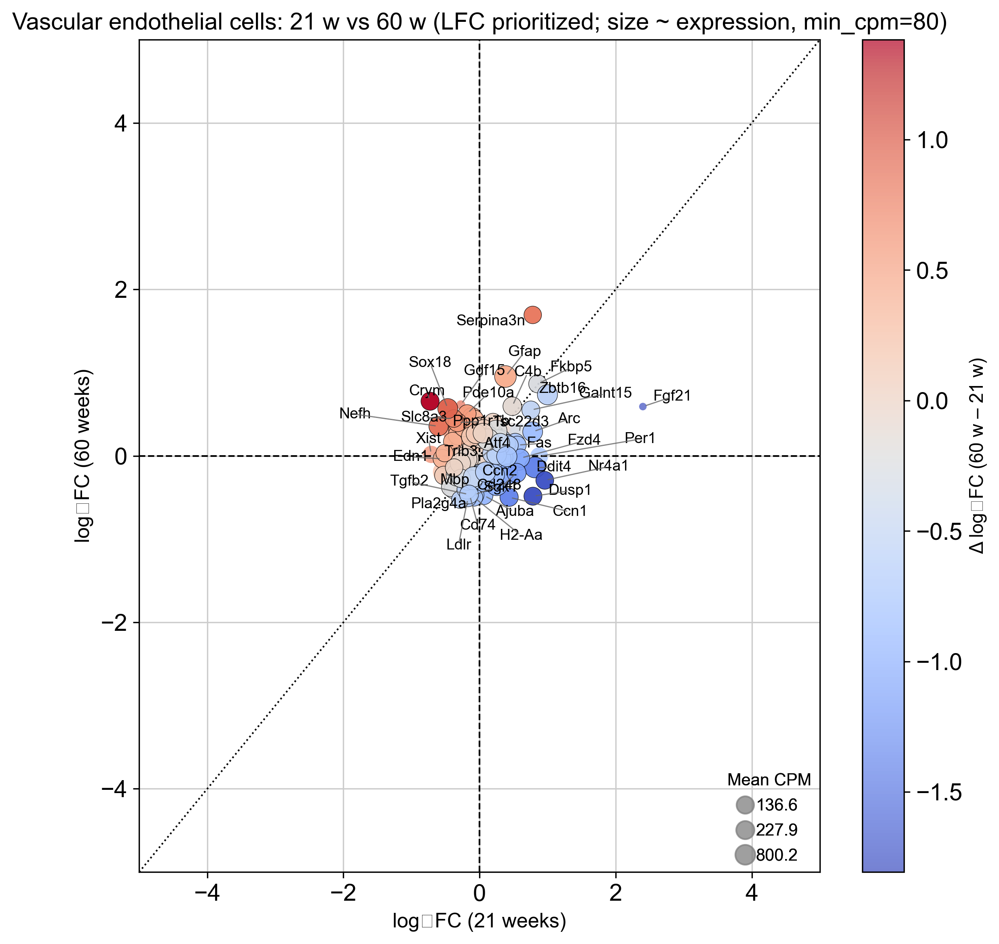

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arc,378.081,0.781,0.201,3.885,0.000,0.057,417.810,1.000,358.643,476.977,203.100,632.519
Ccn2,623.282,0.569,0.133,4.269,0.000,0.020,393.975,1.000,364.873,423.077,334.375,453.575
Crym,304.600,-0.727,0.693,-1.049,0.294,1.000,135.527,1.000,143.703,127.350,163.524,107.529
Ddit4,1374.166,0.812,0.113,7.180,0.000,0.000,835.103,1.000,754.224,915.983,738.032,932.175
Dusp1,168.567,0.784,0.217,3.613,0.000,0.108,123.461,1.000,124.083,122.839,90.442,156.480
Edn1,450.571,-0.545,0.198,-2.756,0.006,0.978,195.932,1.000,218.541,173.323,241.071,150.793
Fas,196.518,0.554,0.192,2.881,0.004,0.736,113.052,1.000,99.965,126.139,105.528,120.576
Fgf21,0.497,2.399,3.390,0.708,0.479,1.000,0.181,0.250,0.000,0.362,0.266,0.096
Fkbp5,205.377,0.855,0.452,1.891,0.059,1.000,121.050,1.000,85.692,156.409,110.289,131.811
Fzd4,250.123,0.602,0.164,3.661,0.000,0.105,146.931,1.000,133.412,160.451,134.267,159.595


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Ajuba,265.979,-0.475,0.161,-2.942,0.003,0.818,163.670,1.000,172.191,155.150,191.303,136.038
C4b,390.712,0.596,0.221,2.704,0.007,1.000,186.550,1.000,151.299,221.801,173.073,200.027
Ccn1,346.806,-0.497,0.169,-2.941,0.003,0.818,146.157,1.000,152.316,139.997,114.865,177.449
Cd248,695.397,-0.470,0.136,-3.462,0.001,0.245,439.849,1.000,474.701,404.998,523.990,355.709
Cd74,370.685,-0.472,0.146,-3.224,0.001,0.422,211.245,1.000,232.416,190.075,232.947,189.544
Crym,210.406,0.656,0.229,2.863,0.004,0.975,135.527,1.000,143.703,127.350,163.524,107.529
Dusp1,305.800,-0.485,0.174,-2.779,0.005,0.975,123.461,1.000,124.083,122.839,90.442,156.480
Fgf21,0.187,0.592,4.429,0.134,0.894,1.000,0.181,0.250,0.000,0.362,0.266,0.096
Fkbp5,257.785,0.865,0.422,2.049,0.040,1.000,121.050,1.000,85.692,156.409,110.289,131.811
Galnt15,236.993,0.551,0.232,2.376,0.018,1.000,120.748,1.000,93.629,147.866,120.258,121.237


2025-10-22 09:54:37 | [INFO] maxp pruned
2025-10-22 09:54:37 | [INFO] LTSH dropped
2025-10-22 09:54:37 | [INFO] cmap pruned
2025-10-22 09:54:37 | [INFO] kern dropped
2025-10-22 09:54:37 | [INFO] post pruned
2025-10-22 09:54:37 | [INFO] PCLT dropped
2025-10-22 09:54:37 | [INFO] JSTF dropped
2025-10-22 09:54:37 | [INFO] DSIG dropped
2025-10-22 09:54:37 | [INFO] GPOS pruned
2025-10-22 09:54:37 | [INFO] GSUB pruned
2025-10-22 09:54:37 | [INFO] glyf pruned
2025-10-22 09:54:37 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:37 | [INFO] Added gid0 to subset
2025-10-22 09:54:37 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:37 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-22 09:54:37 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'K', 'L', 'M', 'P', 'R', 'S', 'T', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'hyphen', '

💾 Saved: ../results/figures/Endothelial_cells_21w_vs_60w.{png, svg, pdf}


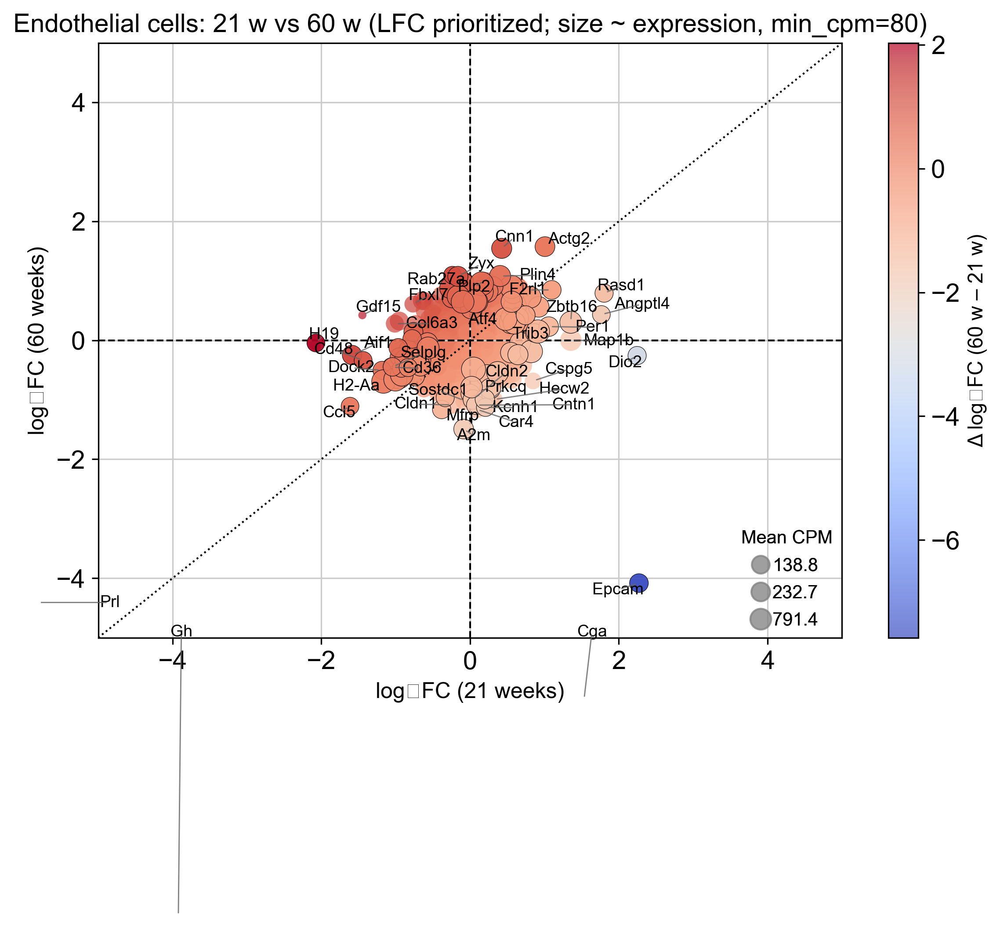

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Aif1,53.187,-1.587,0.476,-3.334,0.001,0.445,211.796,1.000,275.671,147.921,206.428,217.165
Angptl4,25.661,1.765,0.517,3.414,0.001,0.375,90.384,1.000,58.335,122.433,99.512,81.255
Ccl5,24.766,-1.614,0.644,-2.508,0.012,0.999,90.448,1.000,130.071,50.824,96.060,84.836
Cd36,63.992,-1.051,0.432,-2.433,0.015,0.999,189.697,1.000,244.030,135.365,248.139,131.255
Cd48,24.962,-1.438,0.453,-3.174,0.002,0.627,96.773,1.000,126.411,67.134,96.844,96.702
Cga,57.913,1.531,3.063,0.500,0.617,0.999,125.959,0.500,83.894,168.024,225.914,26.004
Col6a3,51.820,-1.012,0.958,-1.056,0.291,0.999,155.251,1.000,186.444,124.059,201.268,109.234
Dio2,35.377,2.246,0.725,3.096,0.002,0.631,114.437,1.000,73.649,155.226,137.696,91.179
Dock2,31.779,-1.184,0.495,-2.391,0.017,0.999,107.235,1.000,138.340,76.129,123.008,91.462
F2rl1,24.664,1.097,0.545,2.015,0.044,0.999,154.913,1.000,109.225,200.602,95.381,214.446


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,42.506,-1.492,0.541,-2.758,0.006,1.0,248.833,1.000,308.433,189.234,288.531,209.135
Actg2,67.082,1.575,0.505,3.116,0.002,1.0,257.314,1.000,146.272,368.357,195.544,319.085
Car4,21.070,-1.160,0.594,-1.952,0.051,1.0,128.174,1.000,144.363,111.985,153.424,102.924
Ccl5,17.349,-1.108,0.677,-1.637,0.102,1.0,90.448,1.000,130.071,50.824,96.060,84.836
Cga,5.405,-6.046,4.220,-1.433,0.152,1.0,125.959,0.500,83.894,168.024,225.914,26.004
Cldn1,19.389,-1.086,0.566,-1.919,0.055,1.0,131.637,1.000,157.629,105.644,168.270,95.004
Cldn2,38.397,-0.995,0.474,-2.099,0.036,1.0,215.256,1.000,246.573,183.940,242.726,187.786
Cnn1,77.336,1.546,0.555,2.785,0.005,1.0,306.640,1.000,200.255,413.024,246.936,366.343
Cntn1,29.800,-1.089,0.465,-2.343,0.019,1.0,160.856,1.000,186.940,134.772,176.077,145.636
Epcam,14.129,-4.083,1.919,-2.127,0.033,1.0,147.734,0.833,103.291,192.176,227.500,67.968


2025-10-22 09:54:39 | [INFO] maxp pruned
2025-10-22 09:54:39 | [INFO] LTSH dropped
2025-10-22 09:54:39 | [INFO] cmap pruned
2025-10-22 09:54:39 | [INFO] kern dropped
2025-10-22 09:54:39 | [INFO] post pruned
2025-10-22 09:54:39 | [INFO] PCLT dropped
2025-10-22 09:54:39 | [INFO] JSTF dropped
2025-10-22 09:54:39 | [INFO] DSIG dropped
2025-10-22 09:54:39 | [INFO] GPOS pruned
2025-10-22 09:54:39 | [INFO] GSUB pruned
2025-10-22 09:54:39 | [INFO] glyf pruned
2025-10-22 09:54:39 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:39 | [INFO] Added gid0 to subset
2025-10-22 09:54:39 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:39 | [INFO] Closing glyph list over 'GSUB': 68 glyphs before
2025-10-22 09:54:39 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'V', 'W', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', '

💾 Saved: ../results/figures/Neural_progenitors_21w_vs_60w.{png, svg, pdf}


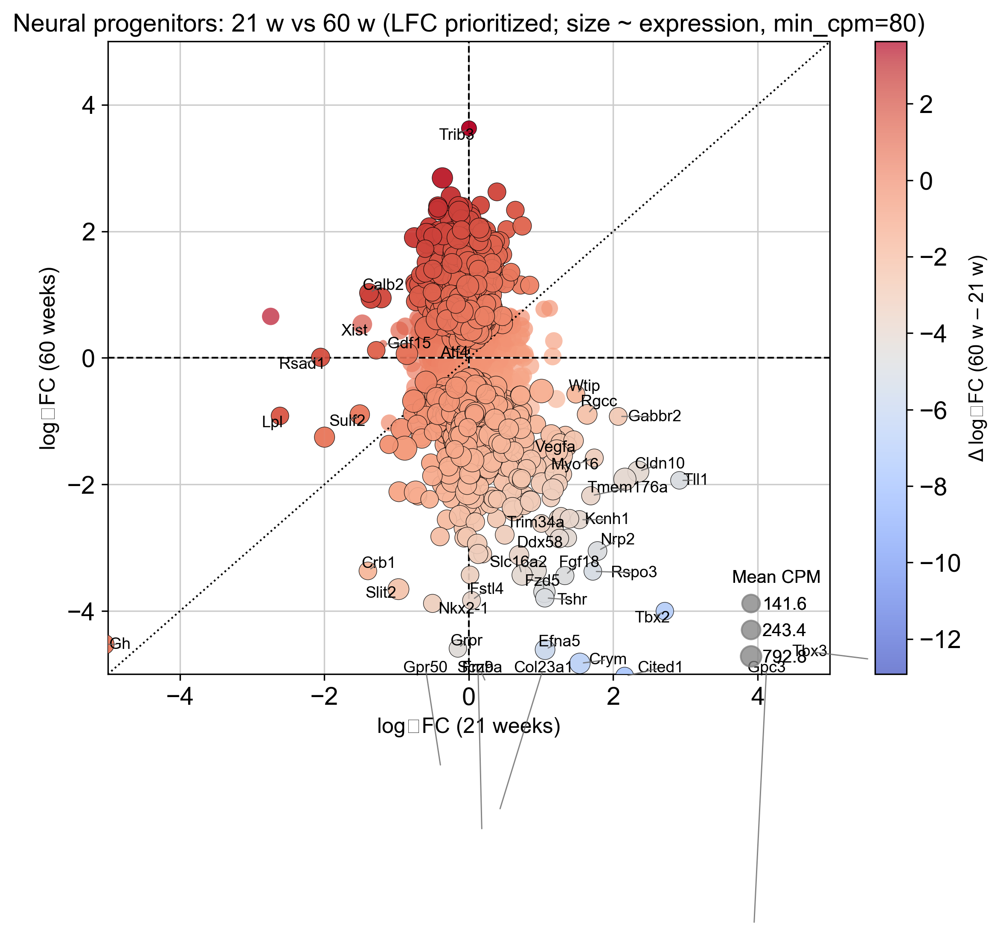

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Calb2,40.914,-1.382,0.618,-2.236,0.025,1.0,170.249,1.000,192.285,148.214,214.540,125.959
Cldn10,141.742,2.347,1.318,1.780,0.075,1.0,614.392,1.000,495.157,733.627,748.677,480.107
Crb1,17.116,-1.398,0.862,-1.621,0.105,1.0,92.413,1.000,150.962,33.863,89.039,95.786
Crym,45.222,1.538,0.822,1.870,0.061,1.0,435.147,1.000,671.162,199.132,237.569,632.725
Ddx58,12.935,1.369,0.955,1.433,0.152,1.0,98.831,1.000,130.929,66.733,68.183,129.479
Gabbr2,15.748,2.069,0.623,3.319,0.001,1.0,99.945,1.000,92.010,107.881,84.275,115.616
Gh,125.099,-5.051,2.133,-2.368,0.018,1.0,325.959,0.583,633.054,18.864,636.787,15.131
Kcnh1,19.413,1.531,0.897,1.707,0.088,1.0,116.807,1.000,138.856,94.758,102.074,131.540
Lpl,29.715,-2.615,1.067,-2.451,0.014,1.0,86.760,0.917,145.301,28.219,152.688,20.833
Myo16,23.982,1.737,0.868,2.001,0.045,1.0,110.171,1.000,99.434,120.908,126.106,94.236


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cited1,23.725,-5.031,0.931,-5.401,0.000,0.000,107.467,0.667,128.014,86.921,102.094,112.840
Col23a1,492.014,-7.179,0.412,-17.404,0.000,0.000,1886.320,1.000,2926.023,846.618,1429.881,2342.760
Crym,132.824,-4.827,0.383,-12.607,0.000,0.000,435.147,1.000,671.162,199.132,237.569,632.725
Efna5,67.512,-4.611,0.492,-9.375,0.000,0.000,280.026,1.000,383.876,176.176,238.131,321.920
Fgf18,33.878,-3.440,0.507,-6.782,0.000,0.000,119.459,1.000,169.936,68.981,77.183,161.735
Frzb,88.424,-7.497,1.075,-6.971,0.000,0.000,382.856,0.667,576.238,189.474,346.120,419.593
Fstl4,29.723,-3.833,0.648,-5.919,0.000,0.000,104.954,1.000,165.438,44.470,67.802,142.107
Fzd5,180.167,-3.696,0.300,-12.328,0.000,0.000,741.902,1.000,992.750,491.054,623.890,859.914
Gh,3.164,-4.526,4.174,-1.084,0.278,0.475,325.959,0.583,633.054,18.864,636.787,15.131
Gpc3,69.113,-8.975,1.914,-4.689,0.000,0.000,245.785,0.667,338.761,152.809,162.524,329.046


2025-10-22 09:54:41 | [INFO] maxp pruned
2025-10-22 09:54:41 | [INFO] LTSH dropped
2025-10-22 09:54:41 | [INFO] cmap pruned
2025-10-22 09:54:41 | [INFO] kern dropped
2025-10-22 09:54:41 | [INFO] post pruned
2025-10-22 09:54:41 | [INFO] PCLT dropped
2025-10-22 09:54:41 | [INFO] JSTF dropped
2025-10-22 09:54:41 | [INFO] DSIG dropped
2025-10-22 09:54:41 | [INFO] GPOS pruned
2025-10-22 09:54:41 | [INFO] GSUB pruned
2025-10-22 09:54:41 | [INFO] glyf pruned
2025-10-22 09:54:41 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:41 | [INFO] Added gid0 to subset
2025-10-22 09:54:41 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:41 | [INFO] Closing glyph list over 'GSUB': 69 glyphs before
2025-10-22 09:54:41 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'S', 'T', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', '

💾 Saved: ../results/figures/Ependymal_cells_21w_vs_60w.{png, svg, pdf}


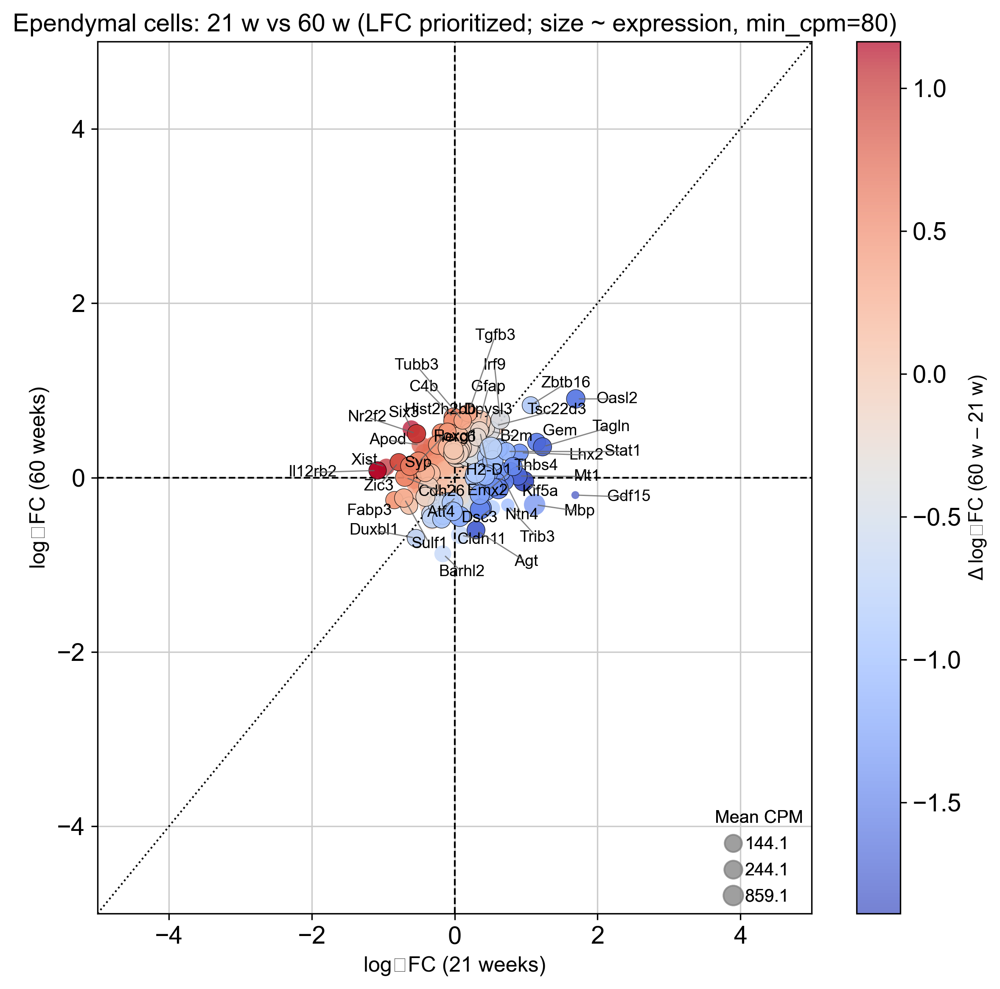

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cdh26,183.453,-0.699,0.260,-2.685,0.007,0.999,202.049,1.000,232.179,171.919,232.356,171.742
Emx2,101.676,0.783,0.272,2.873,0.004,0.999,134.529,1.000,114.781,154.278,128.249,140.809
Fabp3,78.566,-0.844,0.404,-2.089,0.037,0.999,102.694,1.000,121.388,84.000,99.241,106.147
Gdf15,0.204,1.689,4.375,0.386,0.699,0.999,0.671,0.417,0.579,0.763,0.257,1.085
Gem,81.327,1.147,0.292,3.929,0.000,0.411,134.444,1.000,102.911,165.977,102.629,166.259
Il12rb2,107.025,-1.079,0.299,-3.609,0.000,0.494,116.021,1.000,140.546,91.495,135.618,96.423
Kif5a,427.904,0.968,0.484,2.000,0.045,0.999,533.365,1.000,451.647,615.082,539.075,527.654
Lhx2,74.682,0.911,0.260,3.501,0.000,0.557,95.394,1.000,75.964,114.824,94.324,96.465
Mbp,2999.372,1.119,0.571,1.959,0.050,0.999,3322.906,1.000,2791.388,3854.423,3776.065,2869.746
Mt1,154.249,0.887,0.266,3.334,0.001,0.825,192.624,1.000,163.591,221.657,194.851,190.398


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Agt,150.785,-0.602,0.192,-3.129,0.002,0.960,145.881,1.0,156.510,135.252,133.985,157.776
B2m,614.508,0.535,0.184,2.907,0.004,0.971,662.282,1.0,548.457,776.106,682.662,641.901
Barhl2,103.674,-0.874,0.573,-1.526,0.127,1.000,126.731,1.0,148.510,104.953,144.872,108.591
C4b,280.165,0.688,0.227,3.037,0.002,0.962,338.579,1.0,306.036,371.123,384.512,292.647
Cldn11,199.538,-0.658,0.541,-1.216,0.224,1.000,243.474,1.0,264.555,222.394,277.786,209.163
Dpysl3,71.397,0.566,0.281,2.013,0.044,1.000,84.408,1.0,69.557,99.260,94.162,74.654
Duxbl1,94.186,-0.694,0.227,-3.053,0.002,0.962,105.714,1.0,129.237,82.192,112.794,98.634
Foxg1,262.979,0.561,0.201,2.791,0.005,1.000,289.674,1.0,244.128,335.221,304.638,274.711
Gfap,2337.064,0.645,0.431,1.495,0.135,1.000,2458.870,1.0,2048.226,2869.514,2476.571,2441.169
H2-D1,693.886,0.534,0.310,1.725,0.085,1.000,768.274,1.0,656.955,879.594,811.582,724.966


2025-10-22 09:54:43 | [INFO] maxp pruned
2025-10-22 09:54:43 | [INFO] LTSH dropped
2025-10-22 09:54:43 | [INFO] cmap pruned
2025-10-22 09:54:43 | [INFO] kern dropped
2025-10-22 09:54:43 | [INFO] post pruned
2025-10-22 09:54:43 | [INFO] PCLT dropped
2025-10-22 09:54:43 | [INFO] JSTF dropped
2025-10-22 09:54:43 | [INFO] DSIG dropped
2025-10-22 09:54:43 | [INFO] GPOS pruned
2025-10-22 09:54:43 | [INFO] GSUB pruned
2025-10-22 09:54:43 | [INFO] glyf pruned
2025-10-22 09:54:43 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:43 | [INFO] Added gid0 to subset
2025-10-22 09:54:43 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:43 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-22 09:54:43 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'Delta', 'F', 'G', 'H', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'W', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', '

💾 Saved: ../results/figures/Cholinergic_neurons_21w_vs_60w.{png, svg, pdf}


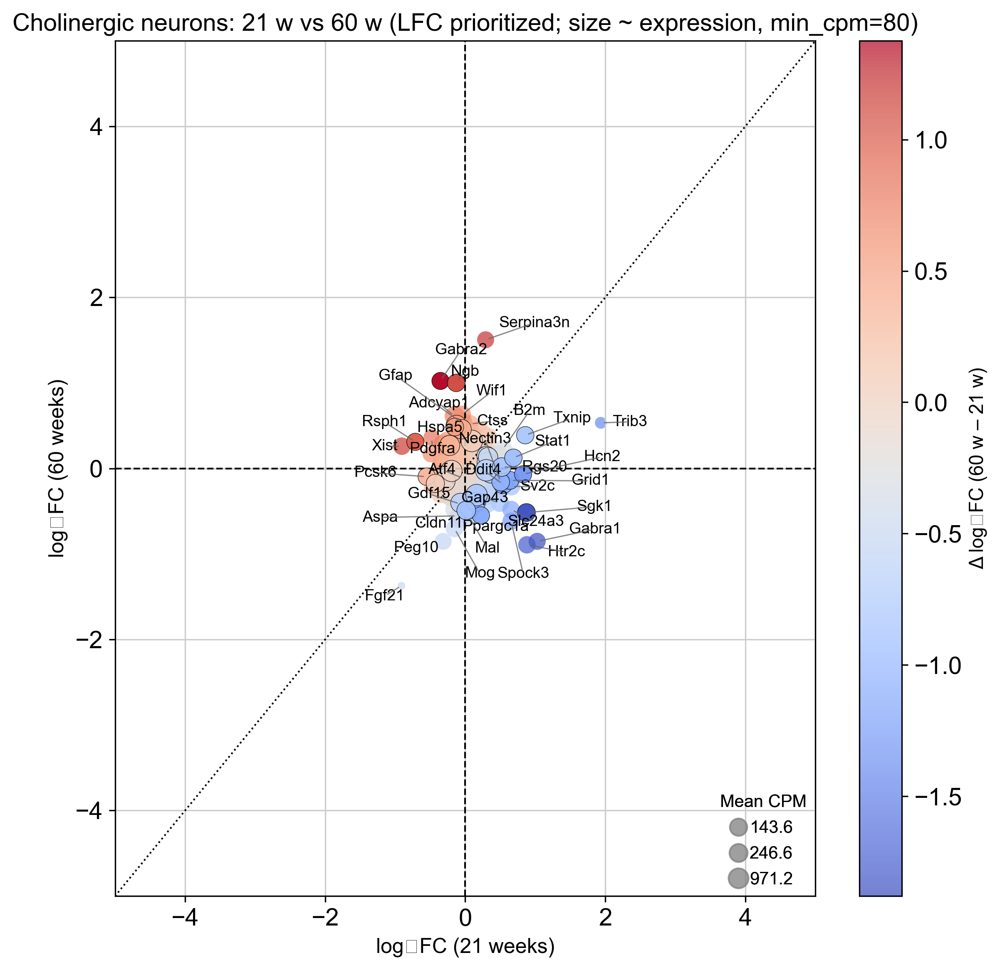

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
B2m,392.174,0.535,0.415,1.289,0.197,1.0,503.459,1.000,436.525,570.393,491.720,515.198
Ddit4,194.360,0.539,0.200,2.691,0.007,1.0,265.992,1.000,250.625,281.359,244.243,287.741
Fgf21,0.113,-0.911,4.450,-0.205,0.838,1.0,0.332,0.333,0.554,0.110,0.140,0.524
Gabra1,98.198,1.027,0.862,1.192,0.233,1.0,127.551,1.000,124.764,130.337,123.622,131.480
Gap43,218.726,0.494,0.796,0.620,0.535,1.0,292.788,1.000,289.823,295.752,275.109,310.467
Grid1,114.498,0.638,0.246,2.596,0.009,1.0,129.835,1.000,116.326,143.344,143.893,115.777
Hcn2,61.264,0.826,0.298,2.767,0.006,1.0,83.806,1.000,73.531,94.080,76.973,90.638
Htr2c,125.965,0.881,1.129,0.780,0.435,1.0,162.937,1.000,163.940,161.934,158.509,167.365
Nectin3,90.208,0.506,0.238,2.129,0.033,1.0,114.650,1.000,107.961,121.340,113.267,116.034
Pcsk6,73.126,-0.549,0.243,-2.263,0.024,1.0,102.276,1.000,113.125,91.426,91.678,112.874


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,834.789,0.612,0.324,1.887,0.059,1.000,1008.423,1.000,941.113,1075.733,1112.622,904.224
Aspa,80.641,-0.555,0.312,-1.775,0.076,1.000,81.909,1.000,91.268,72.551,76.472,87.347
Cldn11,478.562,-0.584,0.331,-1.763,0.078,1.000,541.256,1.000,600.671,481.840,564.323,518.189
Ctss,261.281,0.520,0.492,1.056,0.291,1.000,264.945,1.000,236.290,293.600,246.420,283.471
Fgf21,0.484,-1.372,2.848,-0.482,0.630,1.000,0.332,0.333,0.554,0.110,0.140,0.524
Gabra1,121.364,-0.853,0.481,-1.773,0.076,1.000,127.551,1.000,124.764,130.337,123.622,131.480
Gabra2,76.721,1.022,0.254,4.020,0.000,0.287,84.080,1.000,75.818,92.342,84.957,83.203
Gfap,1903.634,0.530,0.373,1.420,0.156,1.000,1879.307,1.000,1699.769,2058.845,1693.824,2064.789
Hspa5,1110.184,0.499,0.144,3.476,0.001,0.993,1109.637,1.000,1026.311,1192.963,1016.262,1203.012
Htr2c,154.547,-0.893,0.756,-1.181,0.238,1.000,162.937,1.000,163.940,161.934,158.509,167.365


2025-10-22 09:54:45 | [INFO] maxp pruned
2025-10-22 09:54:45 | [INFO] LTSH dropped
2025-10-22 09:54:45 | [INFO] cmap pruned
2025-10-22 09:54:45 | [INFO] kern dropped
2025-10-22 09:54:45 | [INFO] post pruned
2025-10-22 09:54:45 | [INFO] PCLT dropped
2025-10-22 09:54:45 | [INFO] JSTF dropped
2025-10-22 09:54:45 | [INFO] DSIG dropped
2025-10-22 09:54:45 | [INFO] GPOS pruned
2025-10-22 09:54:45 | [INFO] GSUB pruned
2025-10-22 09:54:45 | [INFO] glyf pruned
2025-10-22 09:54:45 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:45 | [INFO] Added gid0 to subset
2025-10-22 09:54:45 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:45 | [INFO] Closing glyph list over 'GSUB': 70 glyphs before
2025-10-22 09:54:45 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'P', 'S', 'T', 'U', 'V', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Chorid_plexus_epithelial_cells_21w_vs_60w.{png, svg, pdf}


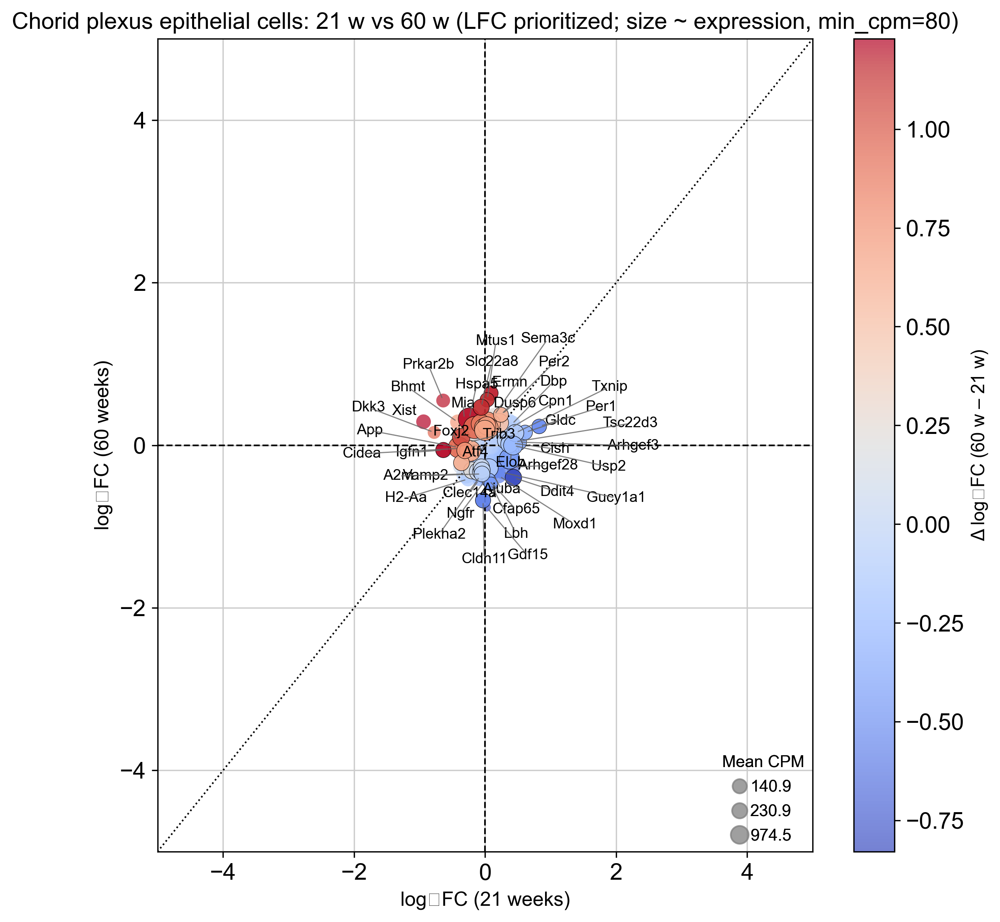

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
App,5726.551,-0.403,0.152,-2.656,0.008,1.0,3690.388,1.000,3992.568,3388.209,3809.454,3571.322
Arhgef28,254.971,0.430,0.224,1.922,0.055,1.0,151.948,1.000,145.811,158.086,168.979,134.918
Arhgef3,568.130,0.503,0.145,3.467,0.001,1.0,395.787,1.000,362.443,429.130,376.486,415.088
Bhmt,421.902,-0.416,0.230,-1.813,0.070,1.0,248.811,1.000,260.566,237.057,280.754,216.868
Cidea,241.722,-0.391,1.130,-0.346,0.730,1.0,158.054,1.000,170.906,145.201,161.209,154.899
Cish,197.663,0.413,0.191,2.167,0.030,1.0,152.401,1.000,142.586,162.216,131.121,173.682
Cpn1,106.551,0.387,0.268,1.446,0.148,1.0,82.549,1.000,73.972,91.127,70.652,94.447
Dbp,1603.043,0.405,0.768,0.527,0.598,1.0,1094.671,1.000,978.528,1210.814,1061.761,1127.581
Ddit4,429.062,0.431,0.178,2.422,0.015,1.0,308.777,1.000,311.799,305.756,284.309,333.246
Dkk3,140.405,-0.778,0.682,-1.140,0.254,1.0,81.181,1.000,91.743,70.619,93.522,68.841


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,3346.822,-0.353,0.762,-0.463,0.643,1.000,2431.222,1.0,2709.744,2152.701,2443.799,2418.645
Ajuba,118.669,-0.351,0.223,-1.574,0.116,1.000,89.413,1.0,93.503,85.323,92.721,86.105
Cfap65,113.305,-0.430,0.213,-2.022,0.043,1.000,96.362,1.0,102.426,90.299,110.428,82.297
Cldn11,226.749,-0.678,0.166,-4.084,0.000,0.219,176.259,1.0,197.749,154.770,187.747,164.771
Clec14a,130.670,-0.419,0.216,-1.935,0.053,1.000,107.695,1.0,116.970,98.420,120.389,95.001
Ddit4,458.649,-0.398,0.139,-2.869,0.004,1.000,308.777,1.0,311.799,305.756,284.309,333.246
Dusp6,336.438,0.381,0.202,1.885,0.059,1.000,203.786,1.0,181.508,226.063,163.405,244.167
Ermn,128.565,0.641,0.230,2.793,0.005,1.000,108.461,1.0,96.923,120.000,123.812,93.110
Gdf15,19.458,-0.765,0.498,-1.537,0.124,1.000,14.164,1.0,16.426,11.901,14.207,14.120
H2-Aa,250.691,-0.416,0.544,-0.765,0.444,1.000,175.443,1.0,197.452,153.434,169.103,181.783


2025-10-22 09:54:47 | [INFO] maxp pruned
2025-10-22 09:54:47 | [INFO] LTSH dropped
2025-10-22 09:54:47 | [INFO] cmap pruned
2025-10-22 09:54:47 | [INFO] kern dropped
2025-10-22 09:54:47 | [INFO] post pruned
2025-10-22 09:54:47 | [INFO] PCLT dropped
2025-10-22 09:54:47 | [INFO] JSTF dropped
2025-10-22 09:54:47 | [INFO] DSIG dropped
2025-10-22 09:54:47 | [INFO] GPOS pruned
2025-10-22 09:54:47 | [INFO] GSUB pruned
2025-10-22 09:54:47 | [INFO] glyf pruned
2025-10-22 09:54:47 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:47 | [INFO] Added gid0 to subset
2025-10-22 09:54:47 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:47 | [INFO] Closing glyph list over 'GSUB': 70 glyphs before
2025-10-22 09:54:47 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'V', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Unknown_21w_vs_60w.{png, svg, pdf}


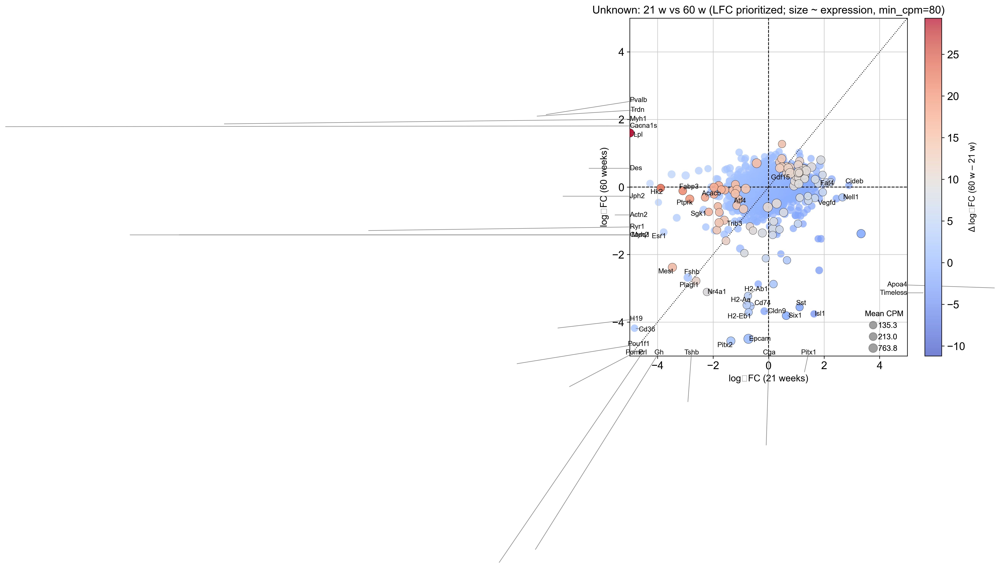

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Acacb,40.218,-2.289,1.008,-2.271,0.023,0.998,94.795,0.917,145.680,43.910,152.296,37.294
Actn2,204.280,-5.586,1.965,-2.843,0.004,0.998,386.176,0.917,747.688,24.665,752.170,20.182
Cideb,17.475,2.893,1.544,1.874,0.061,0.998,93.647,1.000,69.431,117.864,65.656,121.639
Esr1,91.240,-3.778,2.595,-1.456,0.145,0.998,191.800,0.583,353.679,29.921,369.726,13.873
Fabp3,61.890,-3.092,1.414,-2.186,0.029,0.998,147.749,1.000,238.150,57.349,227.709,67.790
Fat4,86.816,2.276,1.239,1.836,0.066,0.998,272.304,1.000,144.464,400.145,360.986,183.622
Fshb,325.854,-2.908,3.045,-0.955,0.340,0.998,666.671,0.333,1165.962,167.379,1328.907,4.434
Gh,2815.927,-8.430,2.373,-3.553,0.000,0.761,6140.151,0.500,12250.232,30.069,11162.349,1117.953
Hk2,61.878,-3.885,1.682,-2.310,0.021,0.998,126.232,0.917,227.851,24.612,231.337,21.126
Lpl,155.412,-4.998,1.673,-2.986,0.003,0.998,305.145,1.000,565.812,44.478,576.557,33.733


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Apoa4,2.172,-2.990,1.645,-1.818,0.069,0.998,90.208,0.583,15.954,164.462,163.136,17.280
Cd36,1.423,-4.180,3.878,-1.078,0.281,0.998,122.303,0.500,235.537,9.068,232.910,11.696
Cd74,15.824,-3.530,1.159,-3.046,0.002,0.974,257.724,0.667,344.296,171.153,387.809,127.639
Cga,15.998,-7.687,2.470,-3.112,0.002,0.974,1599.244,0.500,1632.831,1565.656,3068.778,129.710
Cldn9,1.016,-3.677,2.480,-1.482,0.138,0.998,175.271,0.583,181.687,168.856,342.280,8.262
Epcam,21.804,-4.495,1.436,-3.130,0.002,0.974,1541.133,1.000,1923.737,1158.529,2904.891,177.375
Gh,135.288,-10.769,4.224,-2.549,0.011,0.998,6140.151,0.500,12250.232,30.069,11162.349,1117.953
H19,1.423,-4.180,3.878,-1.078,0.281,0.998,119.529,0.333,239.059,0.000,227.363,11.696
H2-Aa,8.165,-3.498,0.991,-3.532,0.000,0.974,127.288,0.833,176.064,78.511,189.008,65.567
H2-Ab1,6.494,-3.224,1.002,-3.217,0.001,0.974,89.487,0.667,124.429,54.546,126.459,52.516


2025-10-22 09:54:49 | [INFO] maxp pruned
2025-10-22 09:54:49 | [INFO] LTSH dropped
2025-10-22 09:54:49 | [INFO] cmap pruned
2025-10-22 09:54:49 | [INFO] kern dropped
2025-10-22 09:54:49 | [INFO] post pruned
2025-10-22 09:54:49 | [INFO] PCLT dropped
2025-10-22 09:54:49 | [INFO] JSTF dropped
2025-10-22 09:54:49 | [INFO] DSIG dropped
2025-10-22 09:54:49 | [INFO] GPOS pruned
2025-10-22 09:54:49 | [INFO] GSUB pruned
2025-10-22 09:54:49 | [INFO] glyf pruned
2025-10-22 09:54:49 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:49 | [INFO] Added gid0 to subset
2025-10-22 09:54:49 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:49 | [INFO] Closing glyph list over 'GSUB': 65 glyphs before
2025-10-22 09:54:49 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', 'k', 'l', '

💾 Saved: ../results/figures/Neurons_21w_vs_60w.{png, svg, pdf}


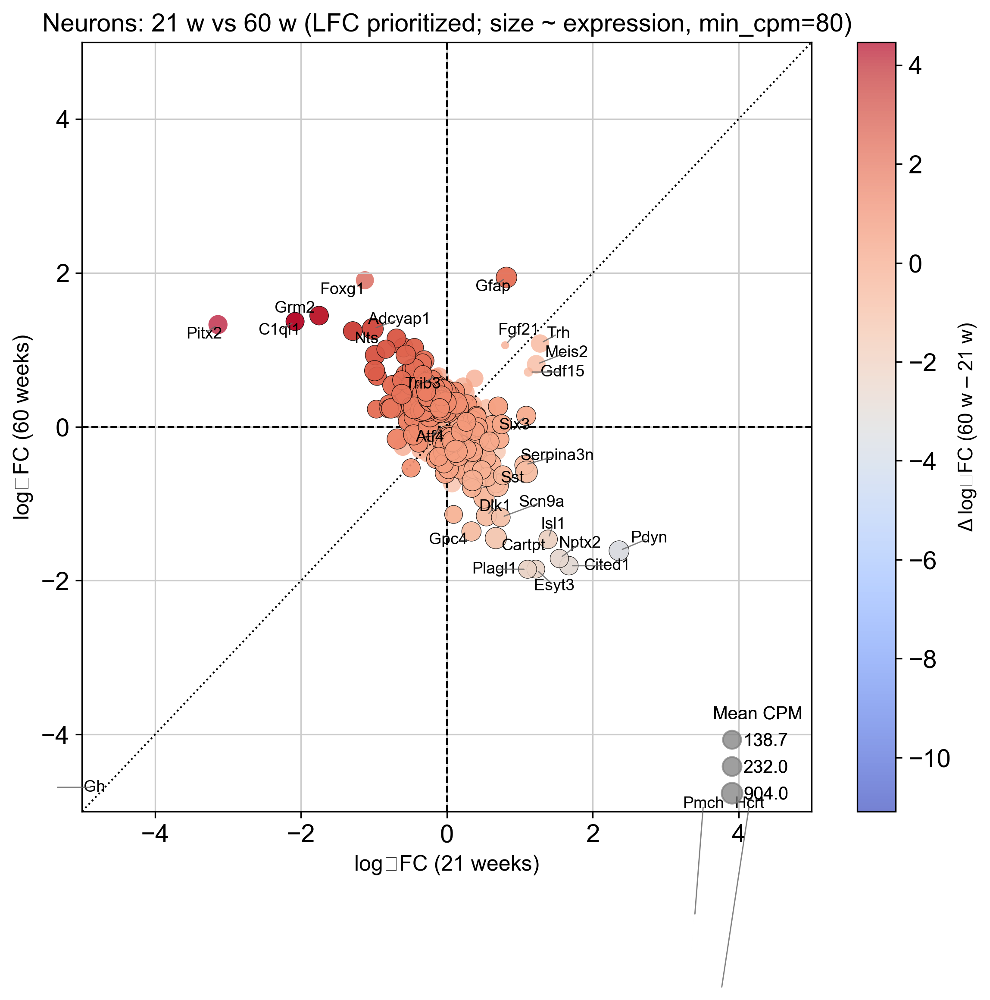

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,3985.920,-1.016,0.394,-2.580,0.010,0.548,619.511,1.000,606.532,632.491,654.886,584.136
C1ql1,673.686,-2.081,0.340,-6.114,0.000,0.000,100.788,1.000,115.343,86.233,111.510,90.066
Cited1,641.753,1.673,0.800,2.090,0.037,0.836,124.384,1.000,135.832,112.937,107.037,141.731
Esyt3,497.335,1.219,0.921,1.323,0.186,0.999,83.385,1.000,90.687,76.082,82.698,84.071
Gdf15,6.111,1.119,0.815,1.372,0.170,0.999,0.907,1.000,0.611,1.202,1.013,0.800
Gh,1632.648,-5.386,1.641,-3.282,0.001,0.136,141.183,0.917,275.597,6.769,270.951,11.415
Grm2,849.485,-1.751,0.720,-2.430,0.015,0.634,136.309,1.000,142.430,130.188,138.805,133.813
Hcrt,1703.726,3.761,1.733,2.169,0.030,0.814,343.392,1.000,420.094,266.691,282.954,403.831
Isl1,654.779,1.388,0.480,2.890,0.004,0.331,122.574,1.000,130.040,115.107,108.810,136.337
Meis2,1360.625,1.225,0.812,1.508,0.131,0.999,215.471,1.000,141.850,289.093,225.318,205.625


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,3859.646,1.272,0.898,1.417,0.157,0.745,619.511,1.000,606.532,632.491,654.886,584.136
C1ql1,595.956,1.368,0.750,1.823,0.068,0.567,100.788,1.000,115.343,86.233,111.510,90.066
Cartpt,5021.926,-1.447,0.583,-2.481,0.013,0.262,750.041,1.000,838.232,661.850,741.108,758.974
Cited1,937.277,-1.806,0.310,-5.828,0.000,0.000,124.384,1.000,135.832,112.937,107.037,141.731
Dlk1,2184.931,-1.159,0.300,-3.867,0.000,0.008,331.365,1.000,362.915,299.815,332.334,330.396
Esyt3,556.365,-1.851,0.428,-4.325,0.000,0.002,83.385,1.000,90.687,76.082,82.698,84.071
Foxg1,917.717,1.904,1.058,1.800,0.072,0.583,142.704,1.000,131.213,154.195,148.913,136.494
Gfap,4067.952,1.940,0.395,4.913,0.000,0.000,487.305,1.000,256.853,717.757,357.945,616.664
Gh,74.833,-4.687,1.829,-2.563,0.010,0.233,141.183,0.917,275.597,6.769,270.951,11.415
Gpc4,1502.669,-1.361,0.358,-3.803,0.000,0.010,201.421,1.000,241.303,161.539,175.609,227.233


2025-10-22 09:54:51 | [INFO] maxp pruned
2025-10-22 09:54:51 | [INFO] LTSH dropped
2025-10-22 09:54:51 | [INFO] cmap pruned
2025-10-22 09:54:51 | [INFO] kern dropped
2025-10-22 09:54:51 | [INFO] post pruned
2025-10-22 09:54:51 | [INFO] PCLT dropped
2025-10-22 09:54:51 | [INFO] JSTF dropped
2025-10-22 09:54:51 | [INFO] DSIG dropped
2025-10-22 09:54:51 | [INFO] GPOS pruned
2025-10-22 09:54:51 | [INFO] GSUB pruned
2025-10-22 09:54:51 | [INFO] glyf pruned
2025-10-22 09:54:51 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:51 | [INFO] Added gid0 to subset
2025-10-22 09:54:51 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:51 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-22 09:54:51 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'O', 'P', 'S', 'T', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'hyphe

💾 Saved: ../results/figures/Olfactory_astrocytes_21w_vs_60w.{png, svg, pdf}


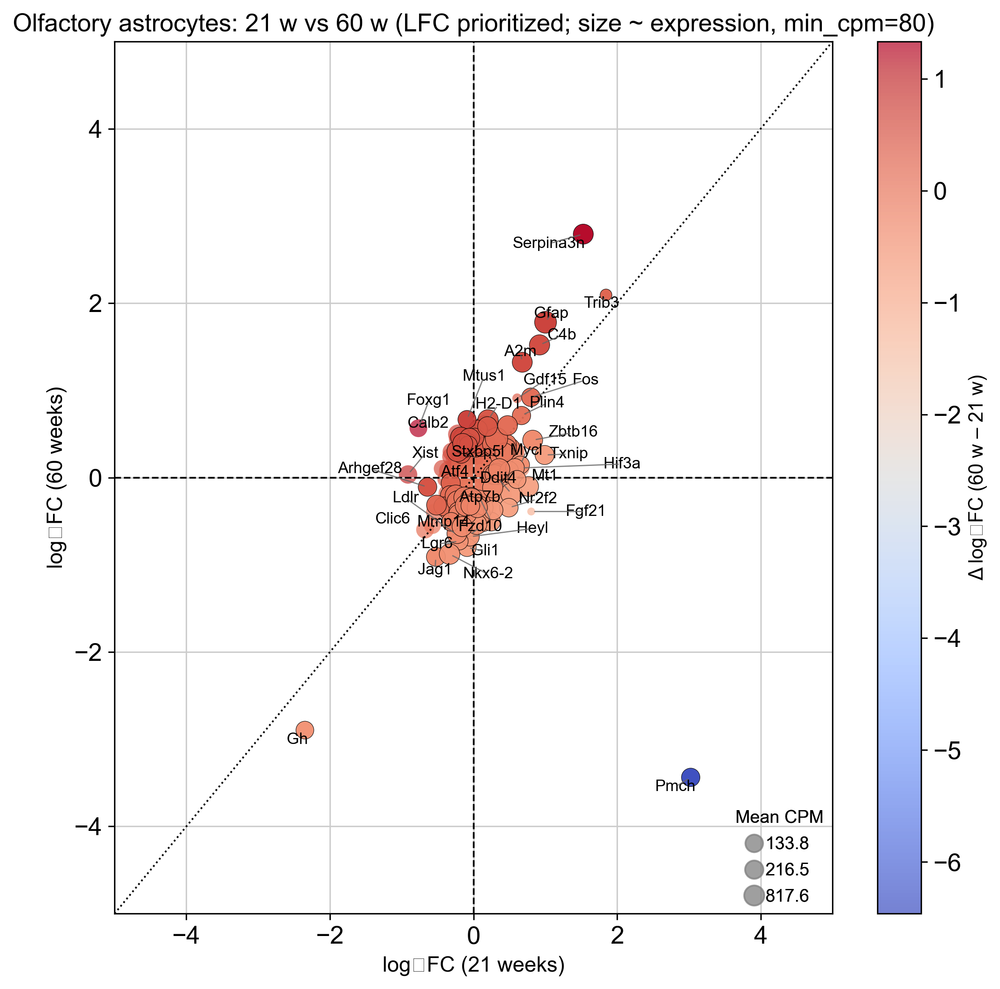

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,734.018,0.679,0.473,1.435,0.151,1.000,408.279,1.000,265.941,550.618,319.919,496.640
Arhgef28,414.755,-0.641,0.291,-2.202,0.028,1.000,155.105,1.000,177.827,132.384,180.630,129.581
C4b,1000.136,0.920,0.616,1.493,0.135,1.000,491.204,1.000,293.323,689.085,437.558,544.850
Clic6,378.639,-0.676,0.706,-0.958,0.338,1.000,147.384,1.000,180.537,114.232,166.099,128.670
Fgf21,0.449,0.804,2.934,0.274,0.784,1.000,0.140,0.417,0.121,0.159,0.195,0.085
Fos,231.986,0.800,0.302,2.649,0.008,1.000,151.247,1.000,106.944,195.550,101.316,201.177
Foxg1,422.536,-0.768,0.970,-0.791,0.429,1.000,158.425,1.000,170.911,145.938,186.366,130.483
Gdf15,2.612,0.608,1.338,0.455,0.649,1.000,1.096,0.917,0.822,1.370,1.139,1.053
Gfap,3024.090,1.003,0.592,1.694,0.090,1.000,1632.657,1.000,880.487,2384.826,1321.317,1943.997
Gh,419.797,-2.349,1.646,-1.427,0.153,1.000,93.994,0.917,157.784,30.204,185.712,2.276


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,1541.486,1.323,0.643,2.057,0.040,0.826,408.279,1.000,265.941,550.618,319.919,496.640
C4b,1689.531,1.522,0.639,2.380,0.017,0.552,491.204,1.000,293.323,689.085,437.558,544.850
Fos,622.582,0.921,0.241,3.813,0.000,0.051,151.247,1.000,106.944,195.550,101.316,201.177
Fzd10,393.083,-0.661,0.231,-2.864,0.004,0.267,132.183,1.000,147.952,116.414,137.153,127.214
Gdf15,3.270,0.909,1.108,0.821,0.412,NaN,1.096,0.917,0.822,1.370,1.139,1.053
Gfap,6023.509,1.781,0.684,2.604,0.009,0.418,1632.657,1.000,880.487,2384.826,1321.317,1943.997
Gh,7.009,-2.896,1.223,-2.367,0.018,0.567,93.994,0.917,157.784,30.204,185.712,2.276
Gli1,317.435,-0.800,0.245,-3.271,0.001,0.120,129.345,1.000,146.001,112.690,155.934,102.756
H2-D1,1724.446,0.661,0.238,2.779,0.005,0.305,536.604,1.000,457.505,615.704,515.480,557.729
Heyl,494.122,-0.678,0.147,-4.601,0.000,0.006,182.270,1.000,203.166,161.375,204.430,160.111


2025-10-22 09:54:53 | [INFO] maxp pruned
2025-10-22 09:54:53 | [INFO] LTSH dropped
2025-10-22 09:54:53 | [INFO] cmap pruned
2025-10-22 09:54:53 | [INFO] kern dropped
2025-10-22 09:54:53 | [INFO] post pruned
2025-10-22 09:54:53 | [INFO] PCLT dropped
2025-10-22 09:54:53 | [INFO] JSTF dropped
2025-10-22 09:54:53 | [INFO] DSIG dropped
2025-10-22 09:54:53 | [INFO] GPOS pruned
2025-10-22 09:54:53 | [INFO] GSUB pruned
2025-10-22 09:54:53 | [INFO] glyf pruned
2025-10-22 09:54:53 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:53 | [INFO] Added gid0 to subset
2025-10-22 09:54:53 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:53 | [INFO] Closing glyph list over 'GSUB': 65 glyphs before
2025-10-22 09:54:53 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'Delta', 'E', 'F', 'G', 'I', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', 'k', '

💾 Saved: ../results/figures/Striatal_neurons_21w_vs_60w.{png, svg, pdf}


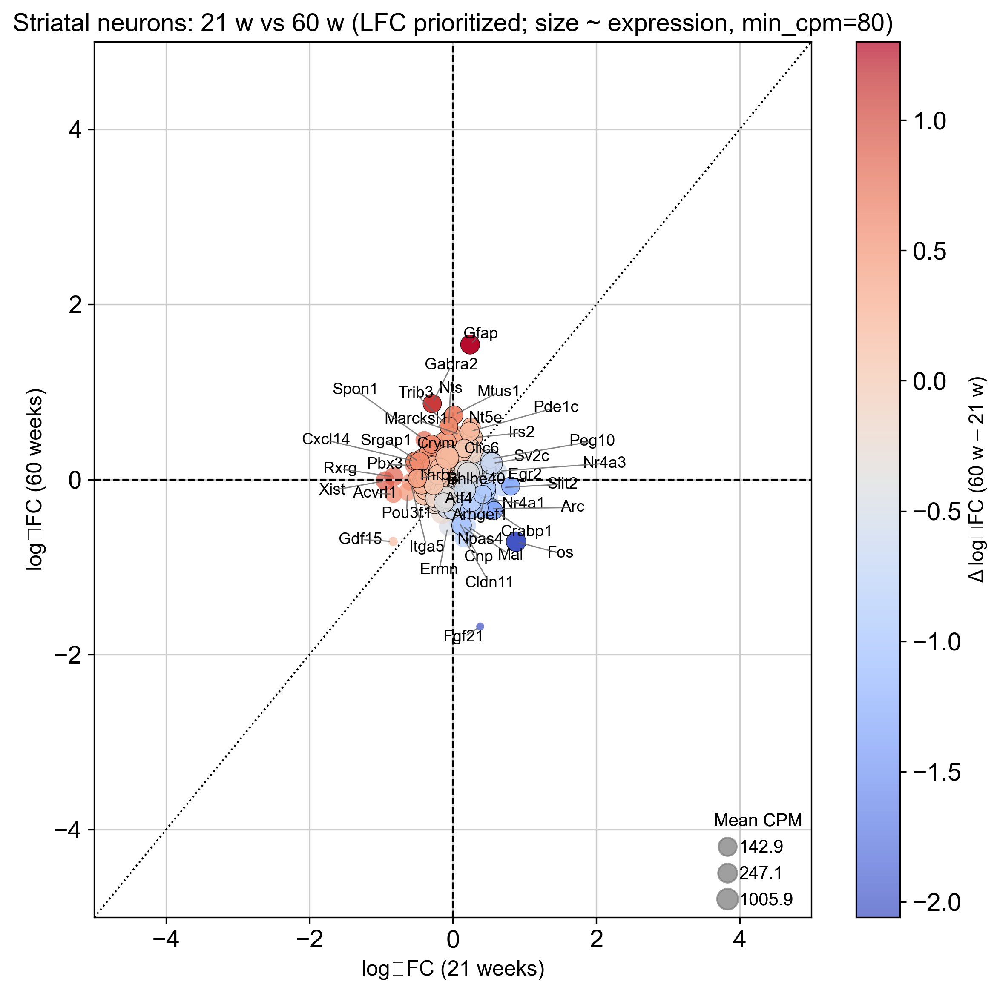

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Acvrl1,455.442,-0.828,0.803,-1.030,0.303,1.000,89.774,1.000,106.514,73.033,107.163,72.384
Arc,1665.995,0.519,0.139,3.739,0.000,0.236,660.175,1.000,675.320,645.031,395.009,925.341
Arhgef1,338.338,0.470,0.182,2.583,0.010,1.000,81.844,1.000,76.324,87.365,80.292,83.397
Bhlhe40,471.090,0.514,0.167,3.075,0.002,1.000,137.630,1.000,123.220,152.040,111.769,163.491
Crabp1,336.272,0.571,0.224,2.552,0.011,1.000,80.226,1.000,76.727,83.724,79.829,80.622
Cxcl14,484.002,-0.527,0.265,-1.983,0.047,1.000,117.637,1.000,123.219,112.056,114.478,120.797
Egr2,217.341,0.807,0.272,2.963,0.003,1.000,92.961,1.000,86.743,99.178,51.633,134.288
Fos,428.357,0.882,0.204,4.323,0.000,0.039,244.014,1.000,274.686,213.341,101.766,386.261
Gdf15,3.970,-0.834,1.035,-0.806,0.420,1.000,0.942,0.917,1.200,0.683,0.938,0.945
Itga5,452.546,-0.592,0.492,-1.203,0.229,1.000,103.522,1.000,114.478,92.565,106.663,100.380


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cldn11,597.929,-0.669,0.420,-1.594,0.111,1.000,163.537,1.000,179.155,147.919,150.679,176.395
Clic6,628.089,0.440,0.128,3.429,0.001,0.137,189.685,1.000,169.989,209.381,193.928,185.442
Cnp,1549.053,-0.472,0.338,-1.397,0.162,1.000,413.799,1.000,444.499,383.099,370.664,456.935
Crym,1787.187,0.470,0.102,4.603,0.000,0.006,547.934,1.000,503.621,592.247,568.060,527.808
Ermn,406.371,-0.540,0.347,-1.556,0.120,1.000,116.280,1.000,128.355,104.205,112.643,119.917
Fgf21,1.187,-1.679,2.006,-0.837,0.403,NaN,0.276,0.500,0.389,0.164,0.202,0.351
Fos,1305.825,-0.710,0.345,-2.060,0.039,1.000,244.014,1.000,274.686,213.341,101.766,386.261
Gabra2,390.596,0.867,0.136,6.360,0.000,0.000,111.285,1.000,98.821,123.750,107.146,115.424
Gdf15,3.201,-0.707,1.095,-0.646,0.518,NaN,0.942,0.917,1.200,0.683,0.938,0.945
Gfap,757.719,1.541,0.756,2.039,0.041,1.000,165.354,1.000,105.536,225.171,106.561,224.146


2025-10-22 09:54:55 | [INFO] maxp pruned
2025-10-22 09:54:55 | [INFO] LTSH dropped
2025-10-22 09:54:55 | [INFO] cmap pruned
2025-10-22 09:54:55 | [INFO] kern dropped
2025-10-22 09:54:55 | [INFO] post pruned
2025-10-22 09:54:55 | [INFO] PCLT dropped
2025-10-22 09:54:55 | [INFO] JSTF dropped
2025-10-22 09:54:55 | [INFO] DSIG dropped
2025-10-22 09:54:55 | [INFO] GPOS pruned
2025-10-22 09:54:55 | [INFO] GSUB pruned
2025-10-22 09:54:55 | [INFO] glyf pruned
2025-10-22 09:54:55 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:55 | [INFO] Added gid0 to subset
2025-10-22 09:54:55 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:55 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-22 09:54:55 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'L', 'M', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', '

💾 Saved: ../results/figures/Excitatory_neurons_(thalamus)_21w_vs_60w.{png, svg, pdf}


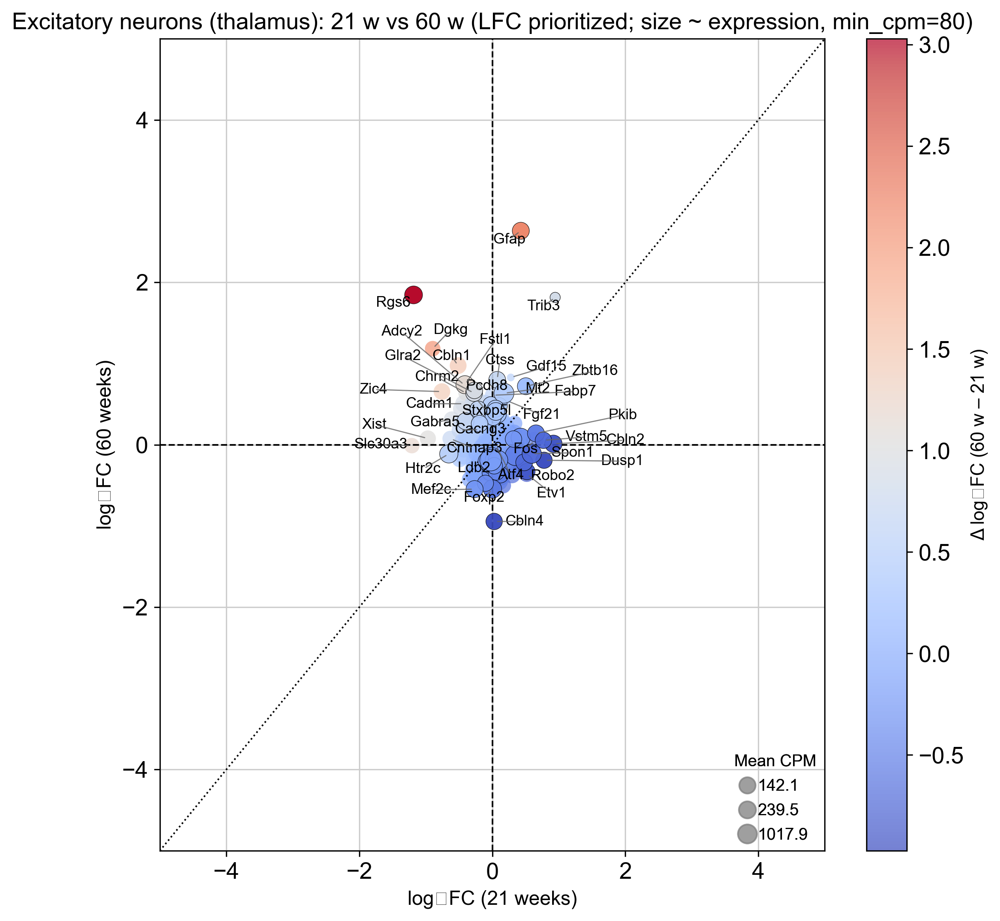

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cacng3,719.929,-0.492,0.397,-1.240,0.215,1.0,111.719,1.0,118.722,104.717,117.695,105.744
Cbln1,1330.560,-0.514,0.746,-0.689,0.491,1.0,207.788,1.0,195.476,220.100,218.276,197.300
Cbln2,1108.175,0.919,0.304,3.021,0.003,1.0,170.161,1.0,141.969,198.353,179.075,161.247
Cntnap3,640.182,-0.631,0.509,-1.239,0.215,1.0,103.832,1.0,114.206,93.458,105.072,102.591
Dgkg,482.403,-0.897,0.890,-1.008,0.313,1.0,85.492,1.0,79.971,91.014,79.639,91.345
Dusp1,394.950,0.778,0.238,3.262,0.001,1.0,91.530,1.0,86.746,96.314,63.729,119.331
Etv1,592.840,0.518,0.327,1.585,0.113,1.0,100.048,1.0,97.810,102.285,95.482,104.613
Fos,1112.801,0.638,0.335,1.905,0.057,1.0,341.358,1.0,315.616,367.100,179.515,503.202
Gabra5,583.936,-0.610,0.532,-1.146,0.252,1.0,100.038,1.0,104.645,95.431,95.850,104.225
Htr2c,1906.839,-0.654,0.314,-2.081,0.037,1.0,324.416,1.0,365.871,282.961,310.647,338.185


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcy2,508.491,0.733,0.473,1.551,0.121,1.000,88.736,1.0,83.679,93.793,86.201,91.272
Cbln1,1097.857,0.974,0.774,1.259,0.208,1.000,207.788,1.0,195.476,220.100,218.276,197.300
Cbln4,547.229,-0.944,0.417,-2.263,0.024,1.000,100.256,1.0,115.067,85.445,103.147,97.364
Chrm2,538.544,0.635,0.350,1.816,0.069,1.000,97.421,1.0,93.696,101.146,98.312,96.531
Ctss,854.153,0.799,0.308,2.592,0.010,0.927,119.395,1.0,97.114,141.677,85.649,153.142
Dgkg,507.434,1.183,0.972,1.217,0.224,1.000,85.492,1.0,79.971,91.014,79.639,91.345
Fabp7,649.373,0.609,0.467,1.306,0.191,1.000,102.120,1.0,89.642,114.597,87.694,116.546
Foxp2,1766.821,-0.545,0.165,-3.310,0.001,0.397,348.550,1.0,377.040,320.061,382.159,314.942
Fstl1,1547.788,0.739,0.355,2.084,0.037,1.000,281.618,1.0,267.257,295.979,285.735,277.501
Gdf15,7.094,0.828,1.010,0.820,0.412,1.000,1.070,1.0,0.848,1.292,0.876,1.263


2025-10-22 09:54:57 | [INFO] maxp pruned
2025-10-22 09:54:57 | [INFO] LTSH dropped
2025-10-22 09:54:57 | [INFO] cmap pruned
2025-10-22 09:54:57 | [INFO] kern dropped
2025-10-22 09:54:57 | [INFO] post pruned
2025-10-22 09:54:57 | [INFO] PCLT dropped
2025-10-22 09:54:57 | [INFO] JSTF dropped
2025-10-22 09:54:57 | [INFO] DSIG dropped
2025-10-22 09:54:57 | [INFO] GPOS pruned
2025-10-22 09:54:57 | [INFO] GSUB pruned
2025-10-22 09:54:57 | [INFO] glyf pruned
2025-10-22 09:54:57 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-22 09:54:57 | [INFO] Added gid0 to subset
2025-10-22 09:54:57 | [INFO] Added first four glyphs to subset
2025-10-22 09:54:57 | [INFO] Closing glyph list over 'GSUB': 68 glyphs before
2025-10-22 09:54:57 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'W', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/D1_medium_spiny_neurons_(striatum)_21w_vs_60w.{png, svg, pdf}


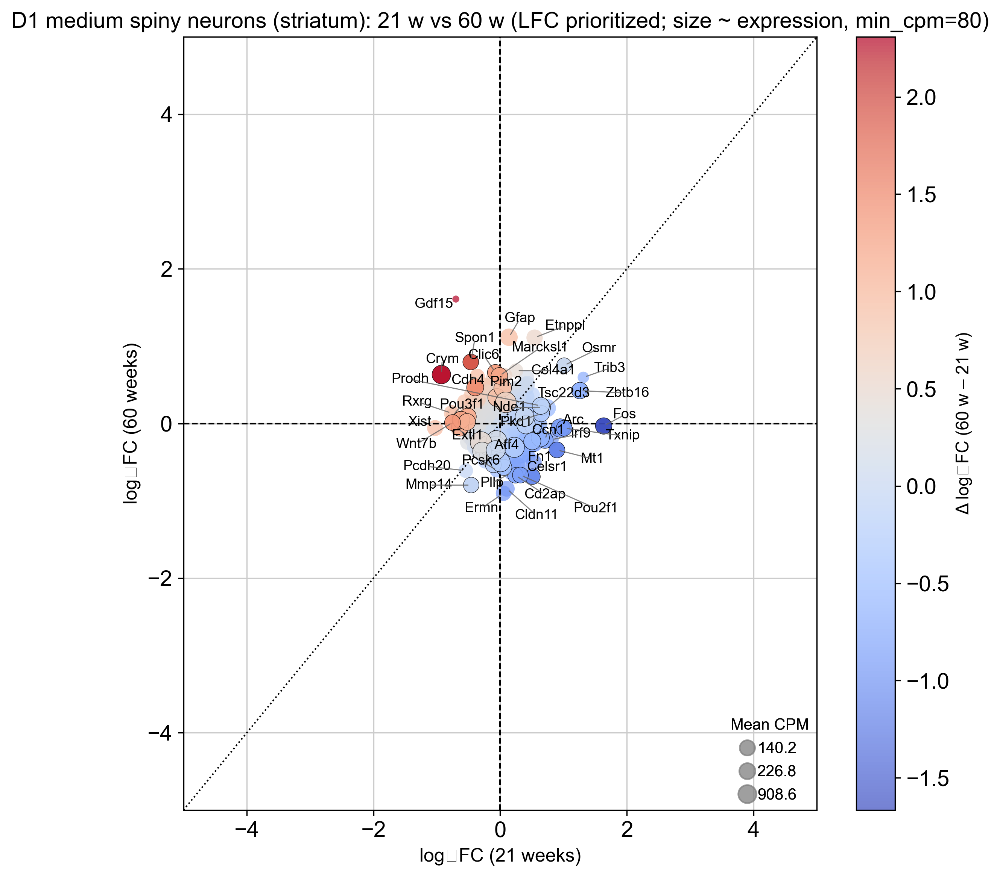

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arc,108.521,0.949,0.266,3.571,0.000,0.549,622.249,1.000,563.653,680.844,364.906,879.592
Ccn1,52.638,0.707,0.286,2.469,0.014,0.999,187.299,1.000,167.555,207.042,177.452,197.146
Crym,242.779,-0.928,0.770,-1.205,0.228,0.999,711.946,1.000,772.707,651.185,813.549,610.343
Extl1,25.960,-0.666,0.417,-1.600,0.110,0.999,94.264,1.000,104.789,83.738,86.539,101.989
Fos,31.074,1.634,0.397,4.119,0.000,0.176,182.845,1.000,152.553,213.137,105.006,260.684
Gdf15,0.650,-0.699,2.428,-0.288,0.773,0.999,2.336,0.583,1.801,2.870,2.185,2.486
Irf9,27.667,0.809,0.432,1.872,0.061,0.999,84.924,1.000,72.829,97.019,93.521,76.328
Mt1,40.319,0.896,0.369,2.427,0.015,0.999,130.393,1.000,112.471,148.316,136.577,124.210
Nde1,41.803,0.671,0.315,2.129,0.033,0.999,128.560,1.000,107.412,149.709,140.913,116.208
Osmr,25.011,1.010,0.486,2.080,0.038,0.999,80.510,1.000,55.285,105.736,84.593,76.428


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cd2ap,41.527,-0.671,0.311,-2.154,0.031,1.0,103.506,1.000,106.769,100.243,110.751,96.261
Cdh4,51.471,0.611,0.320,1.909,0.056,1.0,118.172,1.000,113.073,123.272,117.404,118.940
Celsr1,40.601,-0.687,0.335,-2.053,0.040,1.0,110.341,1.000,107.861,112.822,126.484,94.198
Cldn11,81.886,-0.844,0.563,-1.499,0.134,1.0,195.707,1.000,217.813,173.600,202.343,189.070
Clic6,49.305,0.661,0.293,2.258,0.024,1.0,126.384,1.000,112.885,139.883,138.468,114.300
Col4a1,24.784,0.683,0.424,1.614,0.107,1.0,83.611,1.000,70.690,96.533,109.516,57.707
Crym,263.949,0.633,0.205,3.084,0.002,1.0,711.946,1.000,772.707,651.185,813.549,610.343
Ermn,64.539,-0.902,0.609,-1.481,0.139,1.0,145.287,1.000,165.072,125.501,141.542,149.031
Etnppl,120.576,1.110,0.746,1.487,0.137,1.0,269.916,1.000,188.768,351.064,257.320,282.512
Gdf15,1.056,1.609,2.279,0.706,0.480,1.0,2.336,0.583,1.801,2.870,2.185,2.486


In [33]:
# === Main loop ===
forced = ['Trib3', 'Gdf15','Fgf21','Atf4']
MIN_CPM = 80  # <-- tweak threshold here

for cell, pack in results.items():
    se = pack.get("simple_effects", {})
    if "21" not in se or "60" not in se or se["21"] is None or se["60"] is None:
        print(f"Skipping {cell}: missing 21/60 results.")
        continue

    res21 = se["21"]
    res60 = se["60"]

    gstats = pack.get("gene_stats", None)
    expr_series = gstats["mean_cpm_all"] if (gstats is not None and "mean_cpm_all" in gstats.columns) else None
    if expr_series is not None and not isinstance(expr_series, pd.Series):
        # if it's a column from a DF, make sure it's a Series with gene index
        expr_series = expr_series.squeeze()

    # --- NEW: expression filter (keeps 'forced' regardless of CPM)
    res21_f, res60_f, expr_f = apply_expr_filter(res21, res60, expr_series, min_cpm=MIN_CPM, forced=forced)
    if cell=='Mature oligodendrocytes':
        top_n_each = 30
    else: 
        top_n_each = 20
    # pick tops on the FILTERED sets
    picks, top21, top60 = pick_top_per_age(
        res21_f, res60_f,
        lfc_col='log2FC_mtDSB_vs_control',
        padj_col='pvalue_mtDSB_vs_control',
        q=0.25, top_n_each=top_n_each,
        alpha_lfc=1.0, beta_p=0.0,
        force_lfc_min=0.0, max_labels=100
    )

    # labels = selected + forced (dedup) but only for genes that survived filter
    labels = [g for g in dict.fromkeys(list(picks) + forced) if g in res21_f.index]

    safe_name = cell.replace(" ", "_").replace("/", "_")
    save_base = os.path.join(outdir, f"{safe_name}_21w_vs_60w")

    _ = compare_lfc_scatter_colored_labels(
        res21_f, res60_f,
        highlight_genes=labels,
        expr=expr_f,  # sized points reflect filtered mean CPM
        title=f"{cell}: 21 w vs 60 w (LFC prioritized; size ~ expression, min_cpm={MIN_CPM})",
        xlim=(-5, 5), ylim=(-5, 5),
        save_base=save_base
    )

    _display_top_table(res21_f, top21, cell, "21 w")
    _display_top_table(res60_f, top60, cell, "60 w")

## mitokine expression

In [54]:
mitokine_like = [
    "Gdf15", "Adm", "Cst7", "Igfbp3", "Serpina3n",
    "Cdkn1a", "Maff", "Eif4ebp1", "Aldh1l2"
]

In [55]:
import pandas as pd

records = []
for cell, pack in results.items():
    se = pack.get("simple_effects", {})
    for age in ("21", "60"):
        if age in se and isinstance(se[age], pd.DataFrame):
            res = se[age]
            for gene in mitokine_like:
                if gene in res.index:
                    r = res.loc[gene]
                    records.append({
                        "cell_class": cell,
                        "age": age,
                        "gene": gene,
                        "log2FC": r.get("log2FC_mtDSB_vs_control", None),
                        "padj": r.get("pvalue_mtDSB_vs_control", None),
                        "mean_cpm": r.get("mean_cpm_all", None)
                    })
df = pd.DataFrame(records)

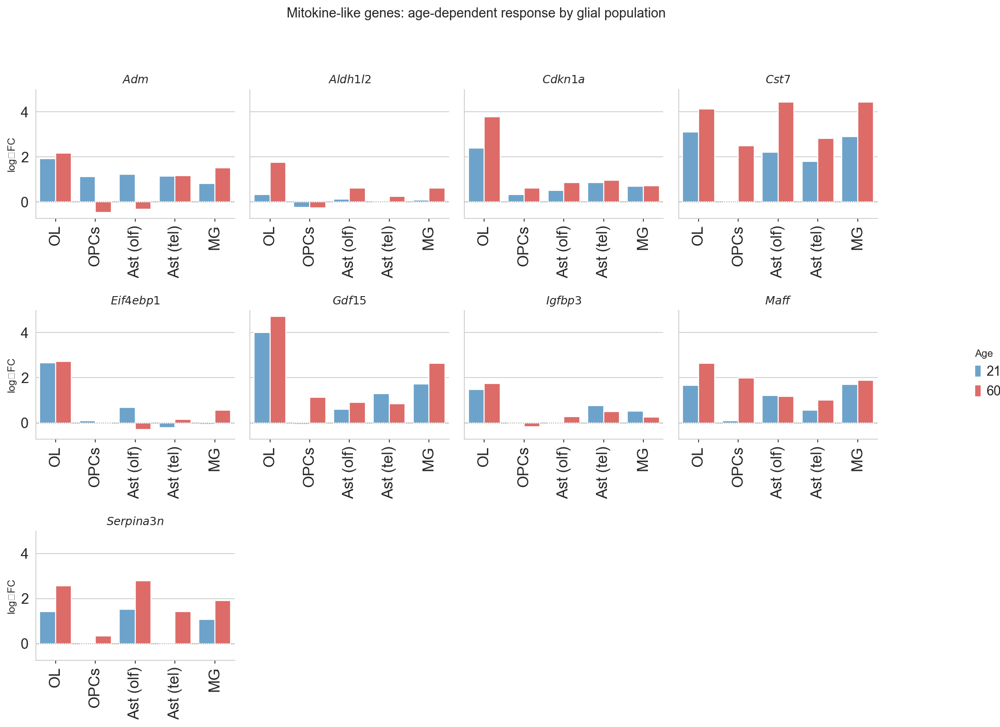

In [57]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- Abbreviations for cell class labels ---
cell_abbrev = {
    "Mature oligodendrocytes": "OL",
    "Oligodendrocytes precursor cells": "OPCs",
    "Olfactory astrocytes": "Ast (olf)",
    "Telencephalon astrocytes": "Ast (tel)",
    "Microglia": "MG",
}

# --- Prepare data ---
bars = (
    df[df["gene"].isin(mitokine_like)]
      .pivot_table(index=["gene", "cell_class", "age"], values="log2FC")
      .reset_index()
)

# Map abbreviations
bars["cell_class"] = bars["cell_class"].map(cell_abbrev).fillna(bars["cell_class"])

# Define consistent order
x_order_full = ["OL", "OPCs", "Ast (olf)", "Ast (tel)", "MG"]
x_order = [x for x in x_order_full if x in bars["cell_class"].unique()]

# --- Plot ---
sns.set_style("whitegrid")
g = sns.catplot(
    data=bars, kind="bar",
    x="cell_class", y="log2FC", hue="age",
    col="gene", col_wrap=4,
    order=x_order,
    palette=["#5DA5DA", "#F15854"],
    height=3.2,
    sharex=False, sharey=True
)

# --- Force draw so ticks exist ---
plt.draw()

# --- Customize each facet ---
for ax in g.axes.flat:
    ax.axhline(0, ls=":", c="0.6", lw=0.8)
    ax.set_xlabel("")
    ax.set_ylabel("log₂FC", fontsize=10)
    ax.set_xticks(np.arange(len(x_order)))
    ax.set_xticklabels(x_order, rotation=90, fontsize=15, fontweight="medium")
    ax.tick_params(axis='x', which='both', bottom=True, top=False, length=3, width=0.8)

    # Italicize gene titles
    title = ax.get_title()
    gene = title.split(" = ", 1)[-1] if " = " in title else title
    ax.set_title(rf"$\it{{{gene}}}$", fontsize=11)

# --- Move legend fully outside ---
g._legend.set_bbox_to_anchor((1.04, 0.5))
g._legend.set_title("Age")
g._legend._legend_box.align = "left"

# --- Figure title & layout ---
g.fig.suptitle(
    "Mitokine-like genes: age-dependent response by glial population",
    y=1.03,
    fontsize=13
)
plt.tight_layout(rect=[0, 0, 0.93, 1])  # extra room for legend

# --- Optional: SVG export (editable text in Illustrator) ---
g.fig.savefig("../results/figures/mitokine_bars_facets.png", bbox_inches="tight", format="png")

plt.show()

## Save results

In [58]:
import os

def save_all_results(results, outdir="../../results"):
    """
    Save all DE results from the nested `results` dict into organized subfolders.
    Structure:
        outdir/
          └── <cell_type>/
                ├── simple_effect_age_<age>.csv
                ├── deltaLFC_<ageA>_vs_<ageB>.csv
    """
    os.makedirs(outdir, exist_ok=True)

    for ct, rdict in results.items():
        ct_dir = os.path.join(outdir, ct.replace(" ", "_"))
        os.makedirs(ct_dir, exist_ok=True)

        # --- Simple effects (mtDSB vs control per age) ---
        for age, df in rdict.get("simple_effects", {}).items():
            if df is not None:
                fname = f"simple_effect_age_{age}.csv"
                df.to_csv(os.path.join(ct_dir, fname))

        # --- Delta-LFC (interaction proxy between ages) ---
        for (a1, a2), df in rdict.get("deltas", {}).items():
            if df is not None:
                fname = f"deltaLFC_{a1}_vs_{a2}.csv"
                df.to_csv(os.path.join(ct_dir, fname))

        print(f"✅ Saved {ct} results to {ct_dir}")

In [59]:
save_all_results(results, outdir="../results/age")

✅ Saved Mature oligodendrocytes results to ../results/age/Mature_oligodendrocytes
✅ Saved Telencephalon astrocytes results to ../results/age/Telencephalon_astrocytes
✅ Saved Microglia results to ../results/age/Microglia
✅ Saved Oligodendrocytes precursor cells results to ../results/age/Oligodendrocytes_precursor_cells
✅ Saved Olfactory astrocytes results to ../results/age/Olfactory_astrocytes


In [60]:
import scanpy as sc

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import scipy.sparse as sp

def plot_spatial_grid_by_condition_age(
    adata,
    gene,
    *,
    layer=None,           # e.g. "log1p", "counts"; None -> .X
    use_raw=False,        # use adata.raw
    spot_size=30,
    cmap="coolwarm",
    percentile=99,        # global vmax percentile across ALL cells
    conditions=None,      # optional subset/list to order conditions (rows)
    ages=None,            # optional subset/list to order ages (cols)
    sample_index=0,       # which sample to show if multiple per (cond, age)
    condition_col="condition",
    age_col="age",
    sample_col="sample_id",
    title_fmt="{cond} | {age} | {sid}",
    vmin=0.0,
    figsize_scale=5.0,    # figure size scaling per row/col
    tight=True,
):
    """
    Plot a grid of spatial maps: rows = condition, cols = age.
    Uses a shared color scale computed from the chosen matrix/layer (or .raw).

    Returns
    -------
    fig, axes : matplotlib Figure and 2D axes array
    """
    # ---- helpers ----
    def _to_dense(x):
        return x.toarray() if sp.issparse(x) else np.asarray(x)

    def _get_gene_values(adata, gene, layer=None, use_raw=False):
        if use_raw:
            if adata.raw is None:
                raise ValueError("use_raw=True but adata.raw is None.")
            if gene not in adata.raw.var_names:
                raise ValueError(f"{gene} not in adata.raw.var_names.")
            mat = adata.raw[:, gene].X
            return _to_dense(mat).ravel()
        if gene not in adata.var_names:
            raise ValueError(f"{gene} not in adata.var_names.")
        if layer is None:
            mat = adata[:, gene].X
        else:
            if layer not in adata.layers:
                raise ValueError(f"Layer '{layer}' not in adata.layers: {list(adata.layers.keys())}")
            mat = adata[:, gene].layers[layer]
        return _to_dense(mat).ravel()

    # ---- basic sanity ----
    if sample_col not in adata.obs.columns:
        raise ValueError(f"'{sample_col}' not found in adata.obs.")
    if condition_col not in adata.obs.columns:
        raise ValueError(f"'{condition_col}' not found in adata.obs.")
    if age_col not in adata.obs.columns:
        raise ValueError(f"'{age_col}' not found in adata.obs.")

    # ---- labels & ordering ----
    cond_series = adata.obs[condition_col].astype(str)
    age_series  = adata.obs[age_col].astype(str)

    # ages: try numeric sort if possible
    if ages is None:
        try:
            uniq_ages = sorted(pd.to_numeric(age_series.unique()))
            ages = list(map(str, uniq_ages))
        except Exception:
            ages = sorted(age_series.unique(), key=lambda x: (len(x), x))
    else:
        ages = list(map(str, ages))

    # conditions: simple sorted unless user supplied
    if conditions is None:
        conditions = sorted(cond_series.unique(), key=lambda x: (len(x), x))
    else:
        conditions = list(map(str, conditions))

    # ---- map (cond, age) -> list of sample_ids
    df_keys = adata.obs[[sample_col, condition_col, age_col]].copy()
    df_keys[condition_col] = df_keys[condition_col].astype(str)
    df_keys[age_col]       = df_keys[age_col].astype(str)

    comb2samples = {}
    for sid, grp in df_keys.groupby(sample_col):
        c = grp[condition_col].iloc[0]
        a = grp[age_col].iloc[0]
        comb2samples.setdefault((c, a), []).append(sid)

    # ---- shared color scale from matrix values ----
    vals = _get_gene_values(adata, gene, layer=layer, use_raw=use_raw)
    vals = vals[np.isfinite(vals)]
    if vals.size == 0:
        raise ValueError(f"No finite values for {gene} in selected matrix/layer.")
    vmax = np.percentile(vals, percentile)

    # ---- figure grid ----
    n_rows, n_cols = len(conditions), len(ages)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_scale * n_cols, figsize_scale * n_rows),
        squeeze=False
    )

    mappable = None
    for i, cond in enumerate(conditions):
        for j, age in enumerate(ages):
            ax = axes[i, j]
            sids = comb2samples.get((cond, age), [])
            if not sids:
                ax.axis("off")
                ax.set_title(f"{cond} | {age}\n(no sample)", fontsize=10)
                continue

            # choose sample
            idx = min(sample_index, len(sids) - 1)
            sid = sids[idx]
            ad_int = adata[adata.obs[sample_col] == sid]

            sc.pl.spatial(
                ad_int,
                color=gene,
                layer=layer,
                spot_size=spot_size,
                vmin=vmin,
                vmax=vmax,
                cmap=cmap,
                show=False,
                ax=ax,
            )
            ax.set_title(title_fmt.format(cond=cond, age=age, sid=sid), fontsize=10)

            if mappable is None:
                ims = ax.get_images()
                if ims:
                    mappable = ims[0]

    # ---- single global colorbar ----
    if mappable is not None:
        cbar = fig.colorbar(mappable, ax=axes, fraction=0.02, pad=0.02)
        cbar.set_label(gene)

    if tight:
        plt.tight_layout()
    plt.show()
    return fig, axes

In [466]:
sc.pp.normalize_total(adata, target_sum=1000)
sc.pp.log1p(adata)

Index(['Cst7', 'Gdf15', 'Hcrt', 'Mbp', 'Mog', 'Myrf', 'Pmch', 'Prl',
       'Serpina3n', 'Sox10', 'Trib3'],
      dtype='object')

In [736]:
mitokine_like = [
    "Gdf15",
]

Gdf15


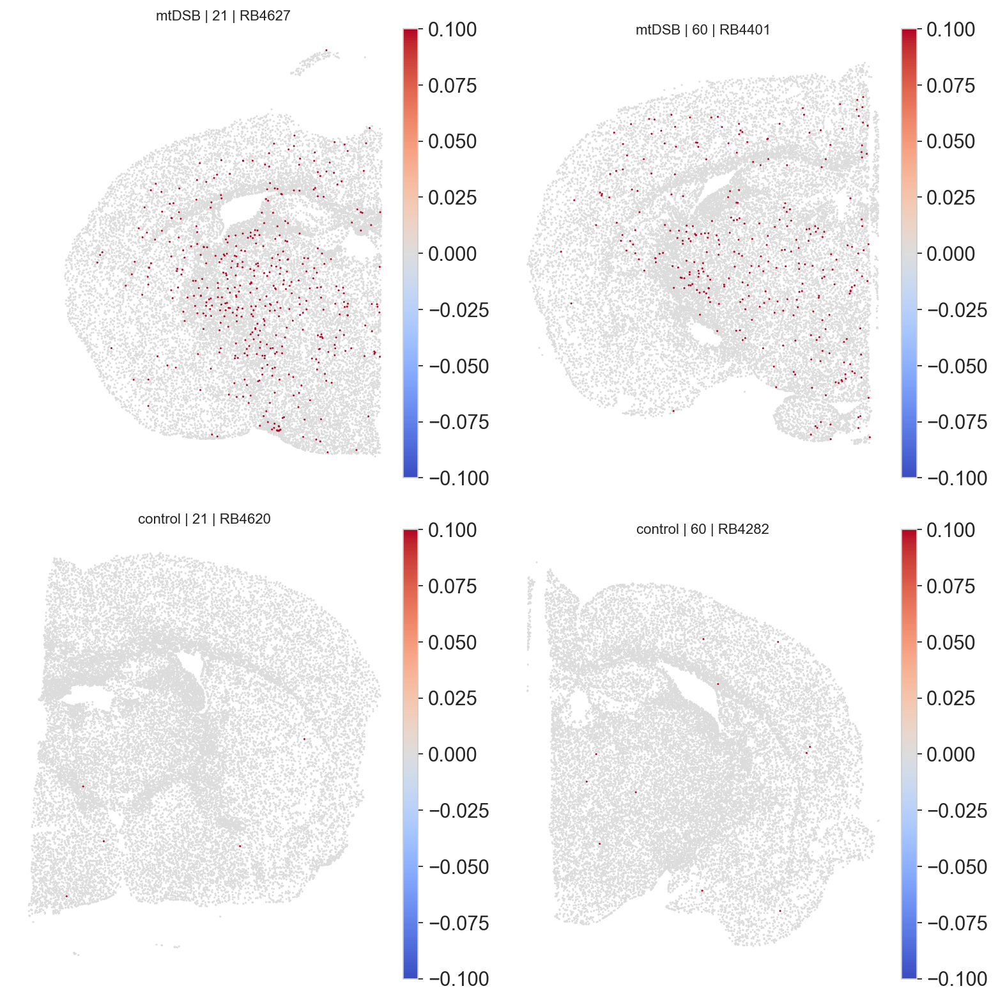

In [737]:
for gene in mitokine_like:
    print(gene)
    fig, axes = plot_spatial_grid_by_condition_age(
        adata,
        gene=gene,
        layer=None,        # or "log1p"/"counts"
        use_raw=False,
        cmap="coolwarm",
        percentile=99,
        spot_size=30,
        condition_col="condition",
        age_col="age",
        sample_col="sample_id",
    )

In [501]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_spatial_grid_basic(
    adata,
    *,
    condition_col="condition",
    age_col="age",
    sample_col="sample_id",
    conditions=None,
    ages=None,
    sample_index=0,
    figsize_scale=5.0,
    spot_size=30,
    # highlight mode
    highlight_col=None,        # e.g. "celltype_merged"
    highlight_value=None,      # e.g. "Microglia"
    highlight_color="tab:red",
    background_grey="#B0B0B0", # darker grey so it shows
    background_alpha=1.0,      # 1.0 = fully opaque background
    title_fmt="{cond} | {age} | {sid}",
    invert_y=True,             # Visium-style orientation
):
    # --- sanity
    for col in (condition_col, age_col, sample_col):
        if col not in adata.obs.columns:
            raise ValueError(f"'{col}' not found in adata.obs.")
    if "spatial" not in adata.obsm_keys():
        raise ValueError("No 'spatial' coordinates in adata.obsm.")

    # order axes
    cond_series = adata.obs[condition_col].astype(str)
    age_series  = adata.obs[age_col].astype(str)

    if ages is None:
        try:
            uniq_ages = sorted(pd.to_numeric(age_series.unique()))
            ages = list(map(str, uniq_ages))
        except Exception:
            ages = sorted(age_series.unique(), key=lambda x: (len(x), x))
    else:
        ages = list(map(str, ages))

    if conditions is None:
        conditions = sorted(cond_series.unique(), key=lambda x: (len(x), x))

    # map (cond, age) -> sample_ids
    key_df = adata.obs[[sample_col, condition_col, age_col]].astype(str)
    comb2samples = {}
    for sid, grp in key_df.groupby(sample_col):
        c = grp[condition_col].iloc[0]; a = grp[age_col].iloc[0]
        comb2samples.setdefault((c, a), []).append(sid)

    # figure
    n_rows, n_cols = len(conditions), len(ages)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_scale * n_cols, figsize_scale * n_rows),
        squeeze=False
    )

    for i, cond in enumerate(conditions):
        for j, age in enumerate(ages):
            ax = axes[i, j]
            sids = comb2samples.get((cond, age), [])
            if not sids:
                ax.axis("off"); ax.set_title(f"{cond} | {age}\n(no sample)", fontsize=10)
                continue

            sid = sids[min(sample_index, len(sids) - 1)]
            ad_sub = adata[adata.obs[sample_col] == sid]
            xy = ad_sub.obsm["spatial"]
            if xy is None or len(xy) == 0:
                ax.axis("off"); ax.set_title(f"{cond} | {age} | {sid}\n(no coords)", fontsize=10)
                continue

            # --- background: ALL cells in grey (opaque unless you change background_alpha)
            ax.scatter(
                xy[:, 0], xy[:, 1],
                s=spot_size,
                c=background_grey,
                alpha=background_alpha,
                edgecolors="none",
                zorder=1,
            )

            # --- overlay highlight (optional)
            if highlight_col is not None and highlight_value is not None:
                if highlight_col not in ad_sub.obs.columns:
                    ax.set_title(f"{cond} | {age} | {sid}\n(no '{highlight_col}')", fontsize=10)
                else:
                    mask = ad_sub.obs[highlight_col].astype(str).values == str(highlight_value)
                    if mask.any():
                        ax.scatter(
                            xy[mask, 0], xy[mask, 1],
                            s=spot_size,
                            c=highlight_color,
                            edgecolors="black",  # thin outline helps pop
                            linewidths=0.2,
                            zorder=2,
                        )

            ax.set_title(title_fmt.format(cond=cond, age=age, sid=sid), fontsize=10)
            ax.set_aspect("equal")
            ax.axis("off")
            if invert_y:
                ax.invert_yaxis()  # match Scanpy/Visium orientation

    plt.tight_layout()
    plt.show()
    return fig, axes

In [505]:
to_keep = ['Telencephalon astrocytes',
 'Olfactory astrocytes',
 'Mature oligodendrocytes',
 'Oligodendrocytes precursor cells']

In [ ]:
for cell in to_keep:
    print(cell)
    fig, axes = plot_spatial_grid_basic(
        adata,
        condition_col="condition",
        age_col="age",
        sample_col="sample_id",
        highlight_col="cell_class",
        highlight_value=cell,
        highlight_color="tab:red",
        spot_size=5,
        background_alpha=0.1,
    
    )

In [630]:
adata.X.max()

np.float32(6.1789427)